In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
version = "V3"

# Prep Packages and Data

In [ ]:
!pip install  pyro-ppl gseapy scanpy igraph leidenalg

In [ ]:
import pyro
import pyro.distributions as dist
from pyro.infer import SVI, TraceMeanField_ELBO
print(f"Pyro version: {pyro.__version__}")

Pyro version: 1.9.1


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
print(f"PyTorch version: {torch.__version__}")

PyTorch version: 2.6.0+cu124


In [ ]:
from tqdm import trange

import os
import math

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud


from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import silhouette_score
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import umap

In [ ]:
import matplotlib.gridspec as gridspec
from matplotlib.patches import Circle
import random
import colorsys

In [ ]:
# Set random seed for reproducibility
seed = 0
torch.manual_seed(seed)
pyro.set_rng_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


# Load gene expression data
# Replace with your actual file path
file_path = "/content/drive/MyDrive/Capstone/raw_data.csv"
print(f"Loading data from {file_path}")
gene_data = pd.read_csv(file_path, index_col=0)

# Display data summary
print(f"Data shape: {gene_data.shape} (cells × genes)")
print(f"Number of cells: {gene_data.shape[0]}")
print(f"Number of genes: {gene_data.shape[1]}")

Using device: cuda:0
Loading data from /content/drive/MyDrive/Capstone/raw_data.csv
Data shape: (2638, 13714) (cells × genes)
Number of cells: 2638
Number of genes: 13714


In [ ]:
print(gene_data.head())

                  AL627309.1  AP006222.2  RP11-206L10.2  RP11-206L10.9  \
AAACATACAACCAC-1           0           0              0              0   
AAACATTGAGCTAC-1           0           0              0              0   
AAACATTGATCAGC-1           0           0              0              0   
AAACCGTGCTTCCG-1           0           0              0              0   
AAACCGTGTATGCG-1           0           0              0              0   

                  LINC00115  NOC2L  KLHL17  PLEKHN1  RP11-54O7.17  HES4  ...  \
AAACATACAACCAC-1          0      0       0        0             0     0  ...   
AAACATTGAGCTAC-1          0      0       0        0             0     0  ...   
AAACATTGATCAGC-1          0      0       0        0             0     0  ...   
AAACCGTGCTTCCG-1          0      0       0        0             0     0  ...   
AAACCGTGTATGCG-1          0      0       0        0             0     0  ...   

                  MT-ND4L  MT-ND4  MT-ND5  MT-ND6  MT-CYB  AC145212.1  \
A

# Data Pre-Processing

## Data Cleaning

### Remove All zeros

In [ ]:
all_zero_columns = gene_data.columns[(gene_data == 0).all(axis=0)]
print("All-zero columns:", all_zero_columns)

All-zero columns: Index(['CDC6'], dtype='object')


In [ ]:
all_zero_rows = gene_data.index[(gene_data == 0).all(axis=1)]
print("All-zero rows:", all_zero_rows)

All-zero rows: Index([], dtype='object')


In [ ]:
col_to_remove = ['CDC6']
gene_data = gene_data.drop(columns=col_to_remove)
print(gene_data.head())

                  AL627309.1  AP006222.2  RP11-206L10.2  RP11-206L10.9  \
AAACATACAACCAC-1           0           0              0              0   
AAACATTGAGCTAC-1           0           0              0              0   
AAACATTGATCAGC-1           0           0              0              0   
AAACCGTGCTTCCG-1           0           0              0              0   
AAACCGTGTATGCG-1           0           0              0              0   

                  LINC00115  NOC2L  KLHL17  PLEKHN1  RP11-54O7.17  HES4  ...  \
AAACATACAACCAC-1          0      0       0        0             0     0  ...   
AAACATTGAGCTAC-1          0      0       0        0             0     0  ...   
AAACATTGATCAGC-1          0      0       0        0             0     0  ...   
AAACCGTGCTTCCG-1          0      0       0        0             0     0  ...   
AAACCGTGTATGCG-1          0      0       0        0             0     0  ...   

                  MT-ND4L  MT-ND4  MT-ND5  MT-ND6  MT-CYB  AC145212.1  \
A

### Check cell_marker if there

In [ ]:
cell_marker = ["IL7R", "CCR7", "CD14", "LYZ",
               "S100A4", "MS4A1", "CD8A", "FCGR3A",
               "MS4A7", "GNLY", "NKG7", "FCER1A",
               "CST3", "PPBP", "CD3D","CD3E"]

gene_data[cell_marker].head()

,IL7R,CCR7,CD14,LYZ,S100A4,MS4A1,CD8A,FCGR3A,MS4A7,GNLY,NKG7,FCER1A,CST3,PPBP,CD3D,CD3E
AAACATACAACCAC-1,3,1,0,1,3,0,1,0,0,0,0,0,0,0,4,2
AAACATTGAGCTAC-1,2,0,0,3,0,6,0,0,0,0,1,0,1,0,0,0
AAACATTGATCAGC-1,1,0,0,2,5,0,0,0,0,1,0,0,1,0,10,2
AAACCGTGCTTCCG-1,0,0,0,24,16,0,0,1,3,0,1,0,22,1,0,0
AAACCGTGTATGCG-1,0,0,0,0,5,0,0,0,0,3,11,0,0,0,0,0


## Log Normalization

In [ ]:
# Step 1: Log Normalization
def log_normalize(gene_data):
    """
    Perform log(x+1) normalization on gene expression data
    """
    # Replace missing values with zeros
    gene_data = gene_data.fillna(0)

    # Log transformation (log(x+1))
    log_normalized_data = np.log1p(gene_data)

    print("Log normalization completed")
    return log_normalized_data

log_normalized_data = log_normalize(gene_data)

Log normalization completed


In [ ]:
print(log_normalized_data.head())

                  AL627309.1  AP006222.2  RP11-206L10.2  RP11-206L10.9  \
AAACATACAACCAC-1         0.0         0.0            0.0            0.0   
AAACATTGAGCTAC-1         0.0         0.0            0.0            0.0   
AAACATTGATCAGC-1         0.0         0.0            0.0            0.0   
AAACCGTGCTTCCG-1         0.0         0.0            0.0            0.0   
AAACCGTGTATGCG-1         0.0         0.0            0.0            0.0   

                  LINC00115  NOC2L  KLHL17  PLEKHN1  RP11-54O7.17  HES4  ...  \
AAACATACAACCAC-1        0.0    0.0     0.0      0.0           0.0   0.0  ...   
AAACATTGAGCTAC-1        0.0    0.0     0.0      0.0           0.0   0.0  ...   
AAACATTGATCAGC-1        0.0    0.0     0.0      0.0           0.0   0.0  ...   
AAACCGTGCTTCCG-1        0.0    0.0     0.0      0.0           0.0   0.0  ...   
AAACCGTGTATGCG-1        0.0    0.0     0.0      0.0           0.0   0.0  ...   

                   MT-ND4L    MT-ND4    MT-ND5  MT-ND6    MT-CYB  AC145212

## Remove Common Genes

In [ ]:
# Step 2: Remove Common Genes
def remove_common_genes(gene_data, threshold_percentage=50):
    """
    Remove genes expressed in more than threshold% of cells
    """
    # Calculate the percentage of cells expressing each gene
    percent_cells_expressing = (gene_data > 0).mean() * 100

    # Get genes expressed in less than the threshold percentage of cells
    uncommon_genes = percent_cells_expressing[percent_cells_expressing < threshold_percentage].index

    # Filter the dataset to keep only uncommon genes
    filtered_data = gene_data[uncommon_genes]

    print(f"Original gene count: {gene_data.shape[1]}")
    print(f"Genes removed: {gene_data.shape[1] - filtered_data.shape[1]}")
    print(f"Remaining gene count: {filtered_data.shape[1]}")

    return filtered_data

# Apply the function to your data (adjust the threshold as needed)
filtered_gene_data = remove_common_genes(log_normalized_data, threshold_percentage=90) # explain

Original gene count: 13713
Genes removed: 105
Remaining gene count: 13608


In [ ]:
cell_marker = ["IL7R", "CCR7", "CD14", "LYZ",
               "S100A4", "MS4A1", "CD8A", "FCGR3A",
               "MS4A7", "GNLY", "NKG7", "FCER1A",
               "CST3", "PPBP", "CD3D","CD3E"]

print(filtered_gene_data[cell_marker].head())

                      IL7R      CCR7  CD14       LYZ    S100A4    MS4A1  \
AAACATACAACCAC-1  1.386294  0.693147   0.0  0.693147  1.386294  0.00000   
AAACATTGAGCTAC-1  1.098612  0.000000   0.0  1.386294  0.000000  1.94591   
AAACATTGATCAGC-1  0.693147  0.000000   0.0  1.098612  1.791759  0.00000   
AAACCGTGCTTCCG-1  0.000000  0.000000   0.0  3.218876  2.833213  0.00000   
AAACCGTGTATGCG-1  0.000000  0.000000   0.0  0.000000  1.791759  0.00000   

                      CD8A    FCGR3A     MS4A7      GNLY      NKG7  FCER1A  \
AAACATACAACCAC-1  0.693147  0.000000  0.000000  0.000000  0.000000     0.0   
AAACATTGAGCTAC-1  0.000000  0.000000  0.000000  0.000000  0.693147     0.0   
AAACATTGATCAGC-1  0.000000  0.000000  0.000000  0.693147  0.000000     0.0   
AAACCGTGCTTCCG-1  0.000000  0.693147  1.386294  0.000000  0.693147     0.0   
AAACCGTGTATGCG-1  0.000000  0.000000  0.000000  1.386294  2.484907     0.0   

                      CST3      PPBP      CD3D      CD3E  
AAACATACAACCAC-1  0.0

## TF-IDF Transformation

TF-IDF transformation highlights genes that are both highly expressed in specific cells (high TF) and relatively unique across the cell population (high IDF). These genes are excellent candidates for distinguishing between cell types in clustering analyses.



- The **TF (Term Frequency)** component represents the expression level of a gene in a cell
- The **IDF (Inverse Document Frequency)** component downweights genes that are expressed in many cells
- Combined, TF-IDF highlights genes that are highly expressed in specific cells but not universally across all cells

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
from scipy import sparse

def apply_tfidf_to_gene_data(multinomial_data, norm=None):
    """
    Apply TF-IDF transformation to gene expression data.

    Parameters:
    -----------
    multinomial_data : pandas DataFrame
        Normalized gene expression data with cells as rows and genes as columns
    norm : str, optional
        Norm used to normalize term vectors ('l1', 'l2' or None)
        None means no normalization, preserving the IDF scaling

    Returns:
    --------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data
    """
    print("Applying TF-IDF transformation to gene expression data...")

    # Convert DataFrame to sparse matrix for efficiency
    X = sparse.csr_matrix(multinomial_data.values)

    # Initialize and fit TF-IDF transformer
    # Since we've already log-normalized and filtered common genes,
    # we skip normalization (norm=None) and just apply IDF weighting
    tfidf_transformer = TfidfTransformer(
        norm=None,  # Set to None to skip additional normalization (norm=norm)
        use_idf=True,  # We still want IDF weighting
        smooth_idf=True,  # Prevents division by zero
        sublinear_tf=False  # No sublinear TF as we've done log normalization
    )

    # Transform the data
    tfidf_matrix = tfidf_transformer.fit_transform(X)

    # Convert back to DataFrame with original indices and columns
    tfidf_data = pd.DataFrame(
        tfidf_matrix.toarray(),
        index=multinomial_data.index,
        columns=multinomial_data.columns
    )

    # Print some statistics about the transformation
    print(f"TF-IDF transformation complete.")
    print(f"Shape of TF-IDF data: {tfidf_data.shape}")
    print(f"Min value: {tfidf_data.min().min():.6f}, Max value: {tfidf_data.max().max():.6f}")

    # Optionally, identify the most important genes based on IDF values
    idf_values = pd.Series(
        tfidf_transformer.idf_,
        index=multinomial_data.columns
    ).sort_values(ascending=False)

    print("\nTop 10 genes with highest IDF (least common across cells):")
    print(idf_values.head(10))

    print("\nBottom 10 genes with lowest IDF (most common across cells):")
    print(idf_values.tail(10))

    return tfidf_data

# Apply TF-IDF to your multinomial data without additional normalization
tfidf_transformed_data = apply_tfidf_to_gene_data(filtered_gene_data, norm=None)

Applying TF-IDF transformation to gene expression data...
TF-IDF transformation complete.
Shape of TF-IDF data: (2638, 13608)
Min value: 0.000000, Max value: 27.652615

Top 10 genes with highest IDF (least common across cells):
UCHL1         8.185008
ESCO2         8.185008
MCM10         8.185008
NEK2          8.185008
FOXM1         8.185008
PKMYT1        8.185008
SHCBP1        8.185008
C1orf61       7.779543
AC104699.1    7.779543
CELSR3        7.779543
dtype: float64

Bottom 10 genes with lowest IDF (most common across cells):
MYL12A    1.134452
BTG1      1.126680
HLA-E     1.119395
RPS4Y1    1.118968
EEF1B2    1.118968
DUSP1     1.115134
RPL38     1.113010
MT-ND2    1.112586
CD52      1.110891
BTF3      1.109622
dtype: float64


# Gene_Selection

### Variance-based filtering
   - Selects genes with highest variance in TF-IDF scores across cells
   - Simple and effective approach
   - Captures genes that distinguish between different cell populations

Selected 2000 genes based on TF-IDF variance
Variance range of selected genes: 6.5642 - 0.5685


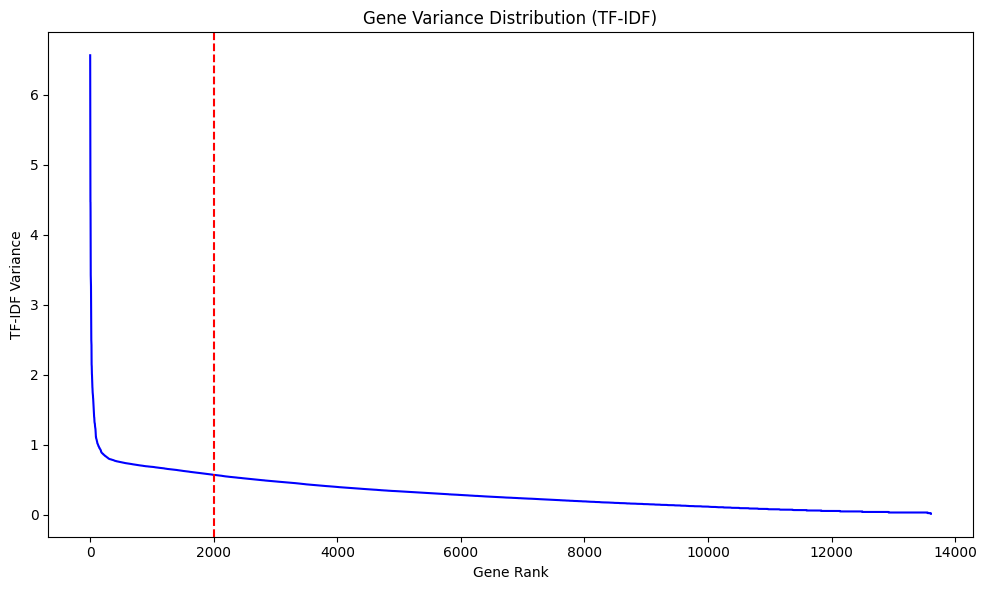

In [ ]:
def filter_genes_by_variance(tfidf_data, top_n=2000):
    """
    Filter genes based on the variance of their TF-IDF scores across cells.

    Parameters:
    -----------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data with cells as rows and genes as columns
    top_n : int, optional
        Number of top variance genes to select

    Returns:
    --------
    filtered_data : pandas DataFrame
        DataFrame containing only the high-variance genes
    selected_genes : list
        List of selected gene names
    """
    # Calculate variance for each gene across cells
    gene_variance = tfidf_data.var(axis=0)

    # Sort genes by variance
    sorted_genes = gene_variance.sort_values(ascending=False)

    # Select top N genes with highest variance
    selected_genes = sorted_genes.index[:top_n].tolist()

    # Filter the TF-IDF data to include only these genes
    filtered_data = tfidf_data[selected_genes]

    print(f"Selected {len(selected_genes)} genes based on TF-IDF variance")
    print(f"Variance range of selected genes: {sorted_genes.iloc[0]:.4f} - {sorted_genes.iloc[top_n-1]:.4f}")

    # Visualize the variance distribution
    plt.figure(figsize=(10, 6))
    plt.plot(range(len(sorted_genes)), sorted_genes.values, 'b-')
    plt.axvline(x=top_n, color='r', linestyle='--')
    plt.xlabel('Gene Rank')
    plt.ylabel('TF-IDF Variance')
    plt.title('Gene Variance Distribution (TF-IDF)')
    plt.tight_layout()
    plt.show()

    return filtered_data, selected_genes

# Option 1: Select by variance (simplest approach)
filtered_data_variance, selected_genes_variance = filter_genes_by_variance(tfidf_transformed_data, top_n=2000)

In [ ]:
print(filtered_data_variance[cell_marker].head())

                      IL7R      CCR7  CD14       LYZ    S100A4     MS4A1  \
AAACATACAACCAC-1  2.646859  1.820379   0.0  1.041731  1.673618  0.000000   
AAACATTGAGCTAC-1  2.097586  0.000000   0.0  2.083461  0.000000  5.540921   
AAACATTGATCAGC-1  1.323429  0.000000   0.0  1.651104  2.163120  0.000000   
AAACCGTGCTTCCG-1  0.000000  0.000000   0.0  4.837647  3.420427  0.000000   
AAACCGTGTATGCG-1  0.000000  0.000000   0.0  0.000000  2.163120  0.000000   

                      CD8A   FCGR3A     MS4A7      GNLY      NKG7  FCER1A  \
AAACATACAACCAC-1  2.173122  0.00000  0.000000  0.000000  0.000000     0.0   
AAACATTGAGCTAC-1  0.000000  0.00000  0.000000  0.000000  1.530045     0.0   
AAACATTGATCAGC-1  0.000000  0.00000  0.000000  1.880326  0.000000     0.0   
AAACCGTGCTTCCG-1  0.000000  1.85741  4.346244  0.000000  1.530045     0.0   
AAACCGTGTATGCG-1  0.000000  0.00000  0.000000  3.760653  5.485156     0.0   

                      CST3      PPBP      CD3D      CD3E  
AAACATACAACCAC-1  0.0

In [ ]:
selected_genes_variance[:8]

['S100A9', 'S100A8', 'CST3', 'NKG7', 'LYZ', 'TYROBP', 'GNLY', 'HLA-DRA']

### Mean TF-IDF score filtering
   - Selects genes with highest average TF-IDF scores
   - Identifies genes that are highly specific to subsets of cells

In [ ]:
def filter_genes_by_mean_tfidf(tfidf_data, top_n=2000):
    """
    Filter genes based on their mean TF-IDF scores across cells.

    Parameters:
    -----------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data with cells as rows and genes as columns
    top_n : int, optional
        Number of top mean-score genes to select

    Returns:
    --------
    filtered_data : pandas DataFrame
        DataFrame containing only the high-mean-score genes
    selected_genes : list
        List of selected gene names
    """
    # Calculate mean TF-IDF score for each gene across cells
    gene_mean_scores = tfidf_data.mean(axis=0)

    # Sort genes by mean score
    sorted_genes = gene_mean_scores.sort_values(ascending=False)

    # Select top N genes with highest mean scores
    selected_genes = sorted_genes.index[:top_n].tolist()

    # Filter the TF-IDF data to include only these genes
    filtered_data = tfidf_data[selected_genes]

    print(f"Selected {len(selected_genes)} genes based on mean TF-IDF scores")
    print(f"Mean score range of selected genes: {sorted_genes.iloc[0]:.4f} - {sorted_genes.iloc[top_n-1]:.4f}")

    return filtered_data, selected_genes

filtered_data_mean, selected_genes_mean = filter_genes_by_mean_tfidf(tfidf_transformed_data, top_n=2000)

Selected 2000 genes based on mean TF-IDF scores
Mean score range of selected genes: 1.9003 - 0.2454


In [ ]:
print(filtered_data_mean[cell_marker].head())

KeyError: "['FCER1A', 'PPBP'] not in index"

In [ ]:
selected_genes_mean[0:8]

['S100A4', 'CD74', 'LYZ', 'HLA-DRA', 'DUSP1', 'LTB', 'CD52', 'S100A9']

### PCA-based importance
   - Uses principal component analysis to identify genes contributing most to variation
   - More sophisticated than simple variance filtering
   - Accounts for covariance structure between genes

Selected 2000 genes based on PCA importance
PCA importance range of selected genes: 0.0016 - 0.0007
Total variance explained by 50 PCs: 8.56%


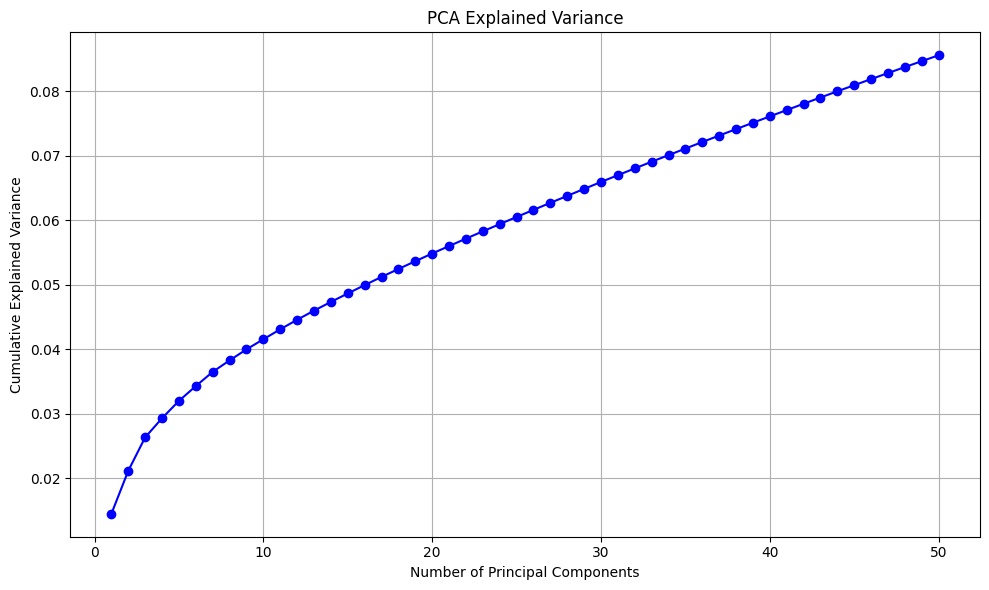

In [ ]:
def filter_genes_by_pca_importance(tfidf_data, n_components=50, top_n=2000):
    """
    Filter genes based on their contribution to principal components.

    Parameters:
    -----------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data with cells as rows and genes as columns
    n_components : int, optional
        Number of principal components to consider
    top_n : int, optional
        Number of top contributing genes to select

    Returns:
    --------
    filtered_data : pandas DataFrame
        DataFrame containing only the selected genes
    selected_genes : list
        List of selected gene names
    """
    # Standardize the data (z-score normalization)
    scaled_data = pd.DataFrame(
        zscore(tfidf_data, axis=0),
        index=tfidf_data.index,
        columns=tfidf_data.columns
    )

    # Apply PCA
    pca = PCA(n_components=n_components)
    pca.fit(scaled_data)

    # Get the absolute loadings (feature importance) from all components
    loadings = pd.DataFrame(
        np.abs(pca.components_),
        columns=tfidf_data.columns
    )

    # Calculate combined importance across all components
    # Weight by explained variance ratio of each component
    weighted_loadings = loadings.T.dot(pd.Series(pca.explained_variance_ratio_))

    # Sort genes by their weighted importance
    sorted_genes = weighted_loadings.sort_values(ascending=False)

    # Select top N genes with highest importance
    selected_genes = sorted_genes.index[:top_n].tolist()

    # Filter the TF-IDF data to include only these genes
    filtered_data = tfidf_data[selected_genes]

    print(f"Selected {len(selected_genes)} genes based on PCA importance")
    print(f"PCA importance range of selected genes: {sorted_genes.iloc[0]:.4f} - {sorted_genes.iloc[top_n-1]:.4f}")
    print(f"Total variance explained by {n_components} PCs: {pca.explained_variance_ratio_.sum():.2%}")

    # Plot explained variance
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, n_components+1), pca.explained_variance_ratio_.cumsum(), 'bo-')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('PCA Explained Variance')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return filtered_data, selected_genes


filtered_data_pca, selected_genes_pca = filter_genes_by_pca_importance(tfidf_transformed_data,
                                                                       n_components=50, top_n=2000)

In [ ]:
print(filtered_data_pca[cell_marker].head())

KeyError: "['CD8A'] not in index"

In [ ]:
selected_genes_pca[:8]

['S100A9',
 'S100A8',
 'S100A4',
 'HLA-DRB1',
 'FCN1',
 'CLIC2',
 'HLA-DRA',
 'HLA-DPA1']

### Cluster-based differential expression
   - Performs initial clustering then identifies marker genes for each cluster
   - Iterative approach that directly targets genes distinguishing cell types
   - Finds genes that characterize specific cell populations

Running PCA for dimensionality reduction before clustering...
Clustering cells into 8 clusters...
Cluster 0: Selected 300 marker genes
Cluster 1: Selected 300 marker genes
Cluster 2: Selected 300 marker genes
Cluster 3: Selected 300 marker genes
Cluster 4: Selected 300 marker genes
Cluster 5: Selected 300 marker genes
Cluster 6: Selected 300 marker genes
Cluster 7: Selected 300 marker genes
Selected a total of 2252 unique genes based on cluster importance
Running t-SNE for visualization...


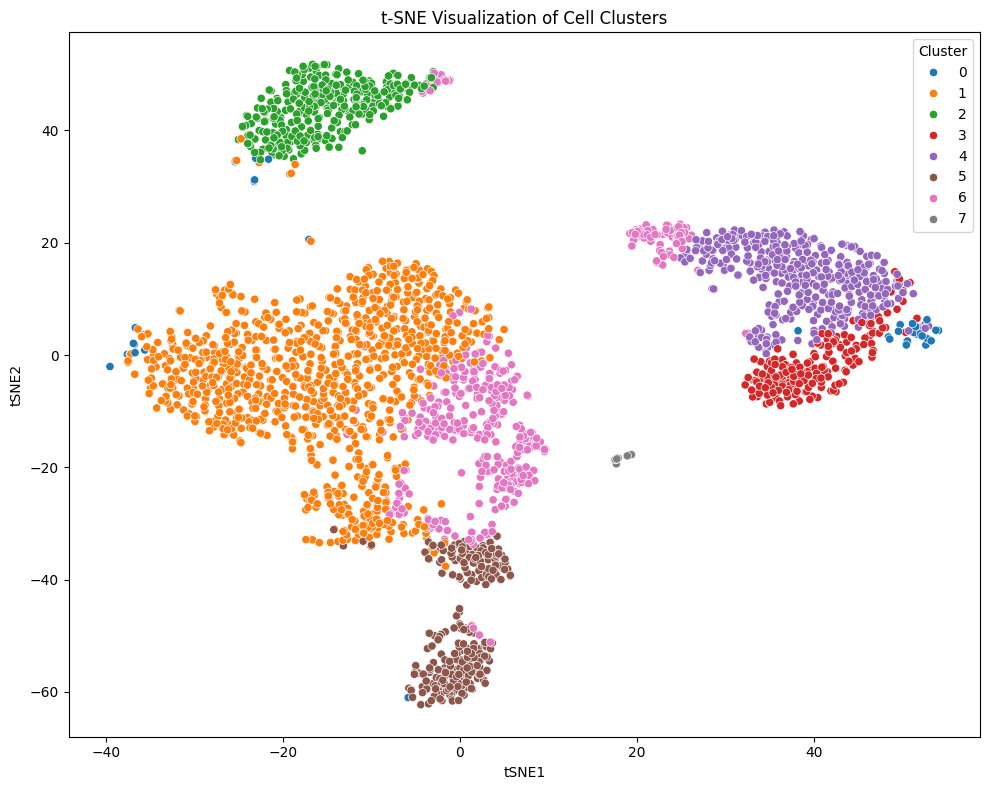

In [ ]:
def filter_genes_by_cluster_importance(tfidf_data, n_clusters=10, top_n_per_cluster=200):
    """
    Filter genes based on their importance for distinguishing between clusters.
    This method:
    1. Performs initial clustering on the data
    2. For each cluster, identifies genes that are differentially expressed

    Parameters:
    -----------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data with cells as rows and genes as columns
    n_clusters : int, optional
        Number of clusters to create
    top_n_per_cluster : int, optional
        Number of top genes to select per cluster

    Returns:
    --------
    filtered_data : pandas DataFrame
        DataFrame containing only the selected genes
    selected_genes : list
        List of selected gene names
    cluster_assignments : pandas Series
        Cluster assignments for each cell
    """
    # First, reduce dimensionality to make clustering more efficient
    print("Running PCA for dimensionality reduction before clustering...")
    pca = PCA(n_components=min(50, tfidf_data.shape[1]))
    pca_result = pca.fit_transform(tfidf_data)

    # Perform clustering
    print(f"Clustering cells into {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    cluster_assignments = pd.Series(
        kmeans.fit_predict(pca_result),
        index=tfidf_data.index,
        name='cluster'
    )

    # For each cluster, find the most important genes
    selected_genes = []

    for cluster_id in range(n_clusters):
        # Get cells in this cluster
        cluster_cells = cluster_assignments[cluster_assignments == cluster_id].index

        # Get cells not in this cluster
        other_cells = cluster_assignments[cluster_assignments != cluster_id].index

        # Calculate mean expression in this cluster and other clusters
        cluster_mean = tfidf_data.loc[cluster_cells].mean(axis=0)
        other_mean = tfidf_data.loc[other_cells].mean(axis=0)

        # Calculate fold change (log2)
        # Adding small constant to avoid division by zero
        fold_change = np.log2((cluster_mean + 1e-5) / (other_mean + 1e-5))

        # Get top genes with highest positive fold change (overexpressed in this cluster)
        top_overexpressed = fold_change.sort_values(ascending=False).head(top_n_per_cluster).index.tolist()
        selected_genes.extend(top_overexpressed)

        print(f"Cluster {cluster_id}: Selected {len(top_overexpressed)} marker genes")

    # Remove duplicates while preserving order
    selected_genes = list(dict.fromkeys(selected_genes))

    # Filter the TF-IDF data to include only these genes
    filtered_data = tfidf_data[selected_genes]

    print(f"Selected a total of {len(selected_genes)} unique genes based on cluster importance")

    # Visualize the clusters
    # Use t-SNE to project the data to 2D for visualization
    print("Running t-SNE for visualization...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30)
    tsne_result = tsne.fit_transform(pca_result)

    # Create a DataFrame for plotting
    tsne_df = pd.DataFrame({
        'tSNE1': tsne_result[:, 0],
        'tSNE2': tsne_result[:, 1],
        'Cluster': cluster_assignments
    }, index=tfidf_data.index)

    # Plot
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=tsne_df, x='tSNE1', y='tSNE2', hue='Cluster', palette='tab10')
    plt.title('t-SNE Visualization of Cell Clusters')
    plt.tight_layout()
    plt.show()

    return filtered_data, selected_genes, cluster_assignments

filtered_data_cluster, selected_genes_cluster, cluster_assignments = filter_genes_by_cluster_importance(
    tfidf_transformed_data, n_clusters=8, top_n_per_cluster=300
)

In [ ]:
print(filtered_data_cluster[cell_marker].head())

KeyError: "['IL7R', 'CCR7', 'LYZ', 'S100A4', 'CD8A', 'CST3', 'CD3D', 'CD3E'] not in index"

### Combined approach
   - Integrates results from multiple methods
   - Ranks genes by how many methods selected them
   - More robust than any single method

In [ ]:
def combine_gene_selection_methods(tfidf_data, top_n_final=2000):
    """
    Combine multiple gene selection methods and select the final set of genes.

    Parameters:
    -----------
    tfidf_data : pandas DataFrame
        TF-IDF transformed gene expression data with cells as rows and genes as columns
    top_n_final : int, optional
        Final number of genes to select

    Returns:
    --------
    filtered_data : pandas DataFrame
        DataFrame containing only the selected genes
    selected_genes : list
        List of selected gene names
    """
    print("Combining results...")

    # Count how many methods selected each gene
    all_genes = list(set(selected_genes_variance + selected_genes_mean + selected_genes_pca + selected_genes_cluster))
    gene_votes = {}

    for gene in all_genes:
        votes = 0
        if gene in selected_genes_variance: votes += 1
        if gene in selected_genes_mean: votes += 1
        if gene in selected_genes_pca: votes += 1
        if gene in selected_genes_cluster: votes += 1
        gene_votes[gene] = votes

    # Sort genes by number of votes (descending) and then by variance (descending)
    gene_variance = tfidf_data.var(axis=0)

    sorted_genes = sorted(
        gene_votes.keys(),
        key=lambda g: (gene_votes[g], gene_variance[g]),
        reverse=True
    )

    # Select top N genes
    final_genes = sorted_genes[:top_n_final]

    # Filter the TF-IDF data to include only these genes
    filtered_data = tfidf_data[final_genes]

    # Count genes by voting category
    vote_counts = {}
    for v in range(1, 5):
        vote_counts[v] = sum(1 for g in gene_votes.values() if g == v)

    print(f"Final gene selection: {len(final_genes)} genes")
    print(f"Vote distribution among all candidate genes:")
    for v, count in vote_counts.items():
        print(f"  {v} vote(s): {count} genes")

    return filtered_data, final_genes

filtered_data_combined, selected_genes_combined = combine_gene_selection_methods(
    tfidf_transformed_data, top_n_final=2000
)

Combining results...
Final gene selection: 2000 genes
Vote distribution among all candidate genes:
  1 vote(s): 2282 genes
  2 vote(s): 1641 genes
  3 vote(s): 820 genes
  4 vote(s): 57 genes


In [ ]:
print(filtered_data_combined[cell_marker].head())

                      IL7R      CCR7  CD14       LYZ    S100A4     MS4A1  \
AAACATACAACCAC-1  2.646859  1.820379   0.0  1.041731  1.673618  0.000000   
AAACATTGAGCTAC-1  2.097586  0.000000   0.0  2.083461  0.000000  5.540921   
AAACATTGATCAGC-1  1.323429  0.000000   0.0  1.651104  2.163120  0.000000   
AAACCGTGCTTCCG-1  0.000000  0.000000   0.0  4.837647  3.420427  0.000000   
AAACCGTGTATGCG-1  0.000000  0.000000   0.0  0.000000  2.163120  0.000000   

                      CD8A   FCGR3A     MS4A7      GNLY      NKG7  FCER1A  \
AAACATACAACCAC-1  2.173122  0.00000  0.000000  0.000000  0.000000     0.0   
AAACATTGAGCTAC-1  0.000000  0.00000  0.000000  0.000000  1.530045     0.0   
AAACATTGATCAGC-1  0.000000  0.00000  0.000000  1.880326  0.000000     0.0   
AAACCGTGCTTCCG-1  0.000000  1.85741  4.346244  0.000000  1.530045     0.0   
AAACCGTGTATGCG-1  0.000000  0.00000  0.000000  3.760653  5.485156     0.0   

                      CST3      PPBP      CD3D      CD3E  
AAACATACAACCAC-1  0.0

In [ ]:
# Save selected_genes_combined to CSV
filtered_data_combined.to_csv(f'/content/drive/MyDrive/Capstone/{version}/filtered_data_combined.csv')
print(f"filtered_data_combined saved to {version}/filtered_data_combined.csv")

filtered_data_combined saved to 'filtered_data_combined.csv'


In [ ]:
selected_genes_combined[:8]

['S100A9', 'S100A8', 'NKG7', 'GNLY', 'GZMB', 'FCN1', 'LGALS2', 'FCGR3A']

In [ ]:
overlap = set(cell_marker) & set(selected_genes_combined[:30])
len(overlap)

6

In [ ]:
overlap = set(cell_marker) & set(selected_genes_variance[:30])
len(overlap)

5

In [ ]:
# Get the list of genes (columns) from filtered_data_combined
genes_to_keep = filtered_data_combined.columns.intersection(gene_data.columns)

# Subset gene_data to keep only these genes
gene_data_subset = gene_data.loc[:, genes_to_keep]

print(gene_data_subset.head())

                  S100A9  S100A8  NKG7  GNLY  GZMB  FCN1  LGALS2  FCGR3A  \
AAACATACAACCAC-1       0       0     0     0     0     0       0       0   
AAACATTGAGCTAC-1       0       0     1     0     0     0       0       0   
AAACATTGATCAGC-1       0       0     0     1     0     0       0       0   
AAACCGTGCTTCCG-1      12       3     1     0     1     1       2       1   
AAACCGTGTATGCG-1       0       0    11     3    12     0       0       0   

                  IFITM3  CD79A  ...  PPP1R14A  XCL1  S1PR5  LYPD2  SPARC  \
AAACATACAACCAC-1       0      0  ...         0     0      0      0      0   
AAACATTGAGCTAC-1       0      3  ...         7     0      0      0      0   
AAACATTGATCAGC-1       0      0  ...         0     0      0      0      0   
AAACCGTGCTTCCG-1       4      0  ...         0     0      0      0      0   
AAACCGTGTATGCG-1       0      0  ...         0     0      0      0      0   

                  FCRL6  KIAA0125  CSTA  GPR56  PRSS23  
AAACATACAACCAC-1      0

In [ ]:
# Save selected_genes_combined to CSV
gene_data_subset.to_csv(f'/content/drive/MyDrive/Capstone/{version}/gene_data_subset.csv')
print(f"gene_data_subset saved to {version}/gene_data_subset.csv")

gene_data_subset saved to 'gene_data_subset.csv'


# PCA + KMeans + TSNE

In [ ]:
filtered_data_combined = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/filtered_data_combined_df.csv', index_col=0)
print(filtered_data_combined.head())

                    S100A9    S100A8      NKG7      GNLY      GZMB      FCN1  \
AAACATACAACCAC-1  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
AAACATTGAGCTAC-1  0.000000  0.000000  1.530045  0.000000  0.000000  0.000000   
AAACATTGATCAGC-1  0.000000  0.000000  0.000000  1.880326  0.000000  0.000000   
AAACCGTGCTTCCG-1  5.201792  3.165938  1.530045  0.000000  2.157742  1.535337   
AAACCGTGTATGCG-1  0.000000  0.000000  5.485156  3.760653  7.984596  0.000000   

                    LGALS2   FCGR3A    IFITM3     CD79A  ...  PPP1R14A  XCL1  \
AAACATACAACCAC-1  0.000000  0.00000  0.000000  0.000000  ...  0.000000   0.0   
AAACATTGAGCTAC-1  0.000000  0.00000  0.000000  3.940783  ...  9.947655   0.0   
AAACATTGATCAGC-1  0.000000  0.00000  0.000000  0.000000  ...  0.000000   0.0   
AAACCGTGCTTCCG-1  2.791936  1.85741  4.001446  0.000000  ...  0.000000   0.0   
AAACCGTGTATGCG-1  0.000000  0.00000  0.000000  0.000000  ...  0.000000   0.0   

                  S1PR5  LYPD2  SPARC 

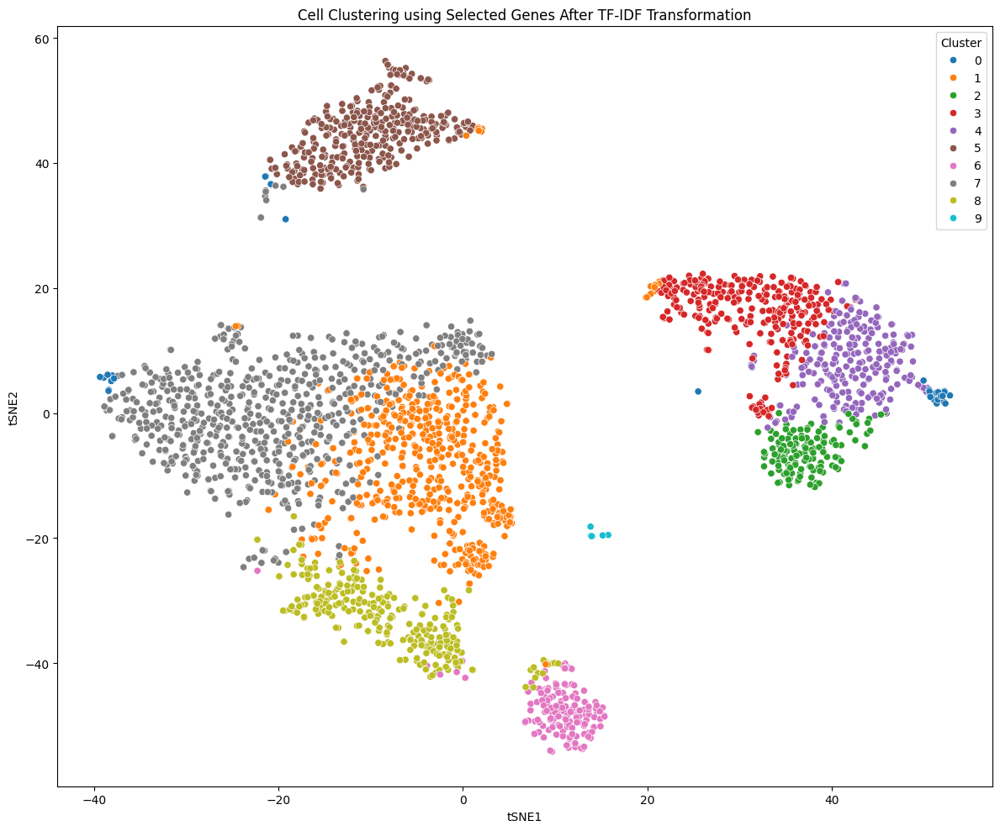

In [ ]:
# Now you can use the filtered data for downstream clustering

# Use the combined filtered data
X = filtered_data_combined

# Dimensionality reduction with PCA first (for efficiency)
pca = PCA(n_components=min(50, X.shape[1]))
pca_result = pca.fit_transform(X)

# t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_result = tsne.fit_transform(pca_result)

# Final clustering
kmeans = KMeans(n_clusters=10, random_state=42, n_init=10)
final_clusters = kmeans.fit_predict(pca_result)

# Create a DataFrame for plotting
tsne_df = pd.DataFrame({
    'tSNE1': tsne_result[:, 0],
    'tSNE2': tsne_result[:, 1],
    'Cluster': final_clusters
}, index=X.index)

# Plot final clustering
plt.figure(figsize=(12, 10))
sns.scatterplot(data=tsne_df, x='tSNE1', y='tSNE2', hue='Cluster', palette='tab10')
plt.title('Cell Clustering using Selected Genes After TF-IDF Transformation')
plt.tight_layout()
plt.show()

In [ ]:
tsne_df.to_csv(f"/content/drive/MyDrive/Capstone/{version}/tsne_df_pca.csv")

In [ ]:
tsne_df_pca = pd.read_csv(f"/content/drive/MyDrive/Capstone/tsne_df_pca.csv", index_col=0)
print(tsne_df_pca.head())

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1 -16.157398 -22.207300        6
AAACATTGAGCTAC-1 -20.501770  37.581970        2
AAACATTGATCAGC-1 -31.134052   8.133083        0
AAACCGTGCTTCCG-1  37.396880   6.689800        1
AAACCGTGTATGCG-1   8.744379 -42.300660        4


In [ ]:
X = tsne_df_pca[['tSNE1', 'tSNE2']].values
labels = tsne_df_pca['Cluster'].values

score = silhouette_score(X, labels)
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: 0.379


## Comparision

### Read Seurat Clusters

In [ ]:
seurat_clusters = pd.read_csv("/content/drive/MyDrive/Capstone/pbmc_metadata.csv", index_col=0)

In [ ]:
seurat_clusters.head()

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.5,seurat_clusters
AAACATACAACCAC-1,pbmc3k,2419,779,3.017776,2,2
AAACATTGAGCTAC-1,pbmc3k,4903,1352,3.793596,3,3
AAACATTGATCAGC-1,pbmc3k,3147,1129,0.889736,2,2
AAACCGTGCTTCCG-1,pbmc3k,2639,960,1.743085,1,1
AAACCGTGTATGCG-1,pbmc3k,980,521,1.224490,6,6


### Cluster Contingency Table



In [ ]:
def compare_clusters(tsne_df, seurat_clusters):
    """
    Compare tSNE clusters with Seurat clusters and compute metrics

    Args:
        tsne_df (pd.DataFrame): DataFrame with cell IDs as index and 'Cluster' column
        seurat_clusters (pd.DataFrame): DataFrame with cell IDs as index and 'seurat_clusters' column

    Returns:
        pd.DataFrame: Contingency table with margins
    """

    # Create a mapping of cell IDs to tSNE clusters
    cell_to_cluster = dict(zip(tsne_df.index, tsne_df['Cluster']))

    # Find shared cells
    shared_cells = set(tsne_df.index).intersection(set(seurat_clusters.index))

    # Create a combined dataframe with both cluster assignments
    combined = pd.DataFrame({
        'tsne_cluster': [cell_to_cluster[cell] for cell in shared_cells],
        'seurat_cluster': [seurat_clusters.loc[cell, 'seurat_clusters'] for cell in shared_cells]
    })

    # Create contingency table with margins
    contingency_with_margins = pd.crosstab(
        combined['tsne_cluster'],
        combined['seurat_cluster'],
        margins=True,
        margins_name='Total'
    )

    # Calculate metrics
    ari = adjusted_rand_score(combined['seurat_cluster'], combined['tsne_cluster'])
    nmi = normalized_mutual_info_score(combined['seurat_cluster'], combined['tsne_cluster'])

    print(f"Adjusted Rand Index: {ari:.4f}")
    print(f"Normalized Mutual Information: {nmi:.4f}")
    print("\nContingency Table (rows: tSNE clusters, columns: Seurat clusters):")

    return contingency_with_margins

In [ ]:
# Example usage:
contingency_table = compare_clusters(tsne_df_pca, seurat_clusters)
print(contingency_table)

Adjusted Rand Index: 0.5660
Normalized Mutual Information: 0.7226

Contingency Table (rows: tSNE clusters, columns: Seurat clusters):
seurat_cluster    0    1    2    3    4    5    6   7   8  Total
tsne_cluster                                                    
0               249    0  398    8    6    0    0   0   0    661
1                 0  210    0    0    0   10    0   8   0    228
2                 0    0    0  324    0    0    0   0   0    324
3                 2    0    8    5    0    0    0  23   0     38
4                 0    0    0    0    4    0  145   0   0    149
5                 1    0   10    0  239    0   10   0   0    260
6               432    9   60    7   42    2    0   0   0    552
7                 0    8    0    0    0  126    0   0   0    134
8                 0    0    0    0    0    0    0   0  13     13
9                 0  254    0    0    0   24    0   1   0    279
Total           684  481  476  344  291  162  155  32  13   2638


### Visualize Contingency Table

In [ ]:
def plot_heatmaps(contingency_table):
    """
    Create sorted heatmaps from contingency table, aligning Seurat clusters to tSNE clusters
    by maximizing row-wise percentage overlap.

    Args:
        contingency_table (pd.DataFrame): Contingency table with margins from compare_clusters function

    Returns:
        tuple: (contingency, contingency_percent) - cleaned and sorted count and percentage tables
    """
    # Remove the 'Total' row and column if present
    contingency = contingency_table.drop(index='Total', columns='Total', errors='ignore')

    # Compute row percentages
    contingency_percent = contingency.div(contingency.sum(axis=1), axis=0) * 100

    # For each tSNE cluster, find the Seurat cluster with the highest percentage
    best_matches = contingency_percent.idxmax(axis=1)

    # Order Seurat clusters by their first appearance as a best match
    # This aligns Seurat clusters to tSNE clusters by their strongest association
    ordered_seurat = []
    for cluster in best_matches:
        if cluster not in ordered_seurat:
            ordered_seurat.append(cluster)
    # Add any remaining clusters not matched as best (to keep all columns)
    ordered_seurat += [c for c in contingency.columns if c not in ordered_seurat]

    # Reorder columns
    contingency = contingency[ordered_seurat]
    contingency_percent = contingency_percent[ordered_seurat]

    # Plot heatmap of counts
    plt.figure(figsize=(10, 8))
    sns.heatmap(contingency, annot=True, cmap='Blues', fmt='d', cbar=True)
    plt.xlabel('Seurat Clusters')
    plt.ylabel('tSNE Clusters')
    plt.title('Cluster Correspondence Heatmap (Cell Counts)')
    plt.tight_layout()
    plt.savefig('cluster_heatmap_counts.png', dpi=300)
    plt.show()

    # Plot heatmap of percentages
    plt.figure(figsize=(10, 8))
    sns.heatmap(contingency_percent, annot=True, cmap='Blues', fmt='.1f', cbar=True)
    plt.xlabel('Seurat Clusters')
    plt.ylabel('tSNE Clusters')
    plt.title('Cluster Correspondence Heatmap (Row Percentages)')
    plt.tight_layout()
    plt.savefig('cluster_heatmap_percentages.png', dpi=300)
    plt.show()

    return contingency, contingency_percent

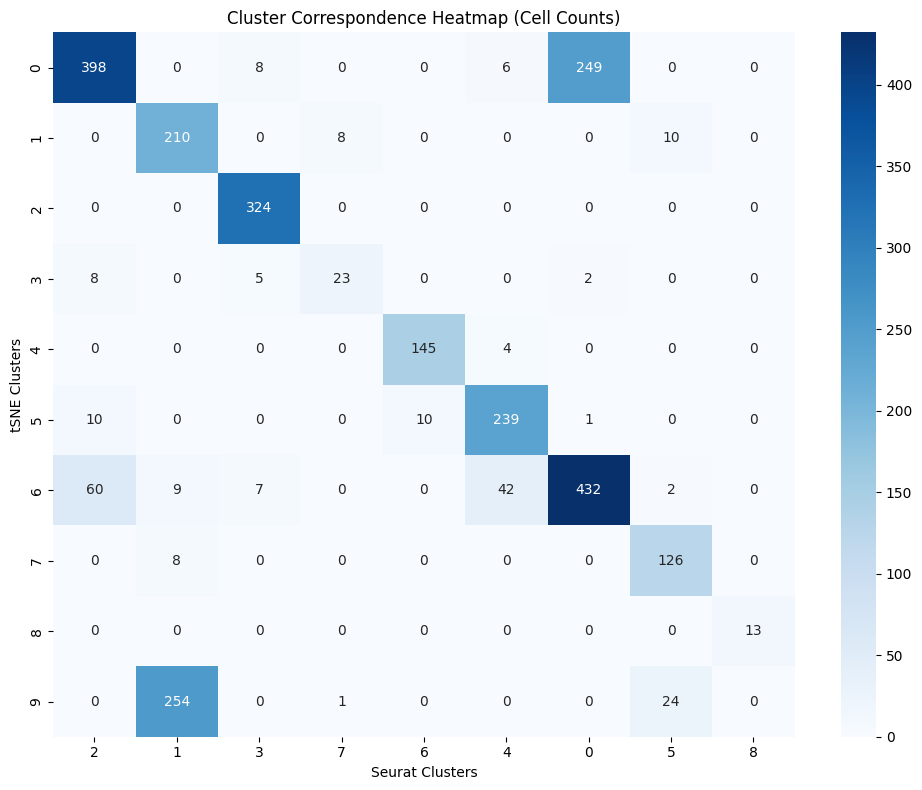

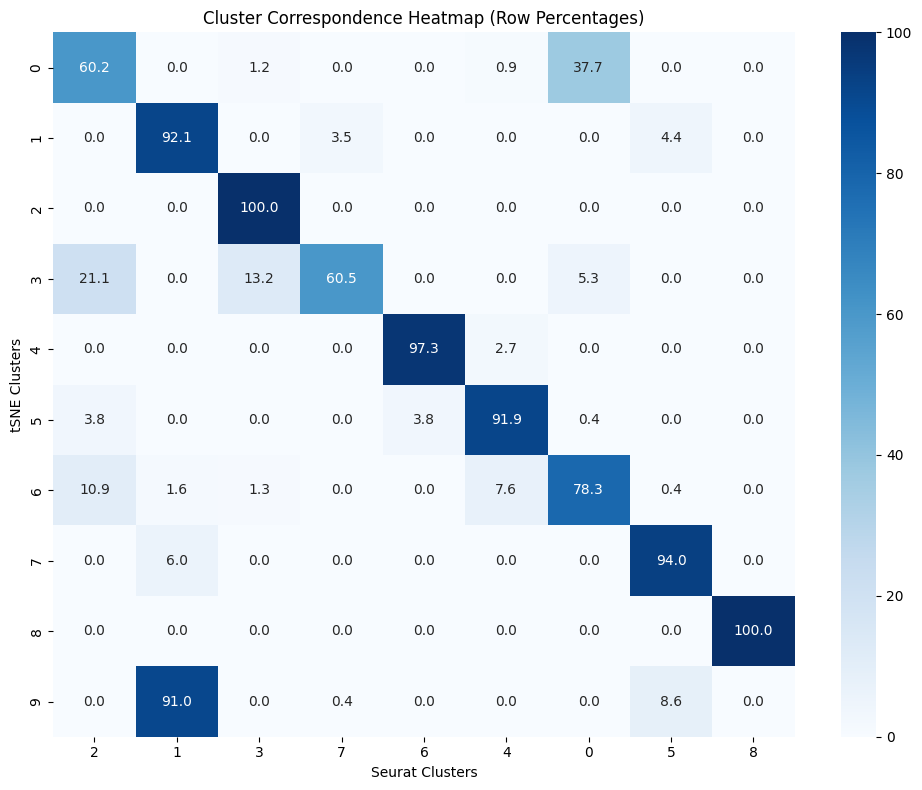

In [ ]:
# Plot sorted heatmaps
counts, percentages = plot_heatmaps(contingency_table)

### Cluster Comparison Visualization

In [ ]:
def plot_cluster_comparison_tsne(tsne_df, seurat_clusters):
    """
    Plot tSNE and Seurat clusters side by side.

    Args:
        tsne_df (pd.DataFrame): DataFrame with cell IDs as index, and columns 'tSNE1', 'tSNE2', 'Cluster'
        seurat_clusters (pd.DataFrame): DataFrame with cell IDs as index and 'seurat_clusters' column
    """
    import matplotlib.pyplot as plt
    import seaborn as sns

    # Copy and rename for clarity
    viz_df = tsne_df.copy()
    viz_df.rename(columns={'Cluster': 'tsne_cluster'}, inplace=True)

    # Add seurat clusters by aligning on the index
    viz_df['seurat_cluster'] = seurat_clusters['seurat_clusters']

    # Remove any rows with missing cluster assignments (optional, for clean plotting)
    viz_df = viz_df.dropna(subset=['tsne_cluster', 'seurat_cluster'])

    # Create side-by-side plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plot tSNE clusters
    sns.scatterplot(
        x='tSNE1', y='tSNE2', hue='tsne_cluster', palette='tab10',
        data=viz_df, alpha=0.7, ax=ax1, legend='full'
    )
    ax1.set_title('tSNE Clustering')
    ax1.legend(title='tSNE Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Seurat clusters
    sns.scatterplot(
        x='tSNE1', y='tSNE2', hue='seurat_cluster', palette='Set1',
        data=viz_df, alpha=0.7, ax=ax2, legend='full'
    )
    ax2.set_title('Seurat Clusters')
    ax2.legend(title='Seurat Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.savefig('cluster_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

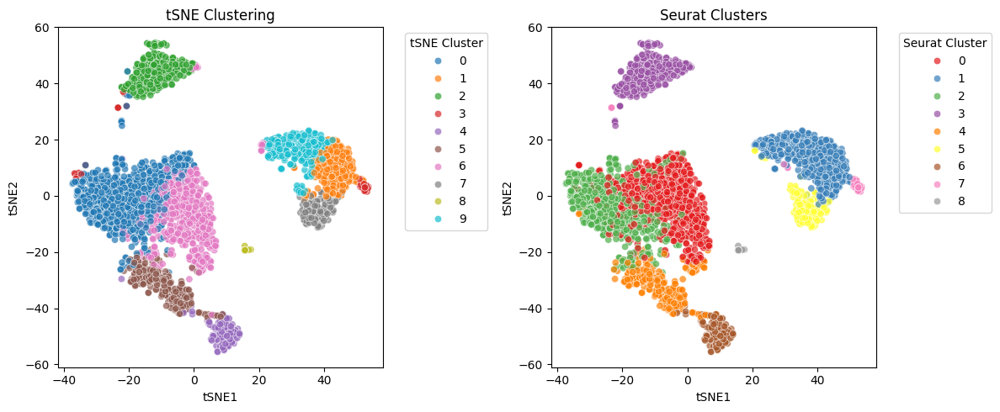

In [ ]:
plot_cluster_comparison_tsne(tsne_df_pca, seurat_clusters)

In [ ]:
def plot_cluster_comparison_umap(umap_df, seurat_clusters):
    """
    Plot tSNE and Seurat clusters side by side.

    Args:
        umap_df (pd.DataFrame): DataFrame with cell IDs as index, and columns 'tSNE1', 'tSNE2', 'Cluster'
        seurat_clusters (pd.DataFrame): DataFrame with cell IDs as index and 'seurat_clusters' column
    """

    # Copy and rename for clarity
    viz_df = umap_df.copy()
    viz_df.rename(columns={'Cluster': 'umap_cluster'}, inplace=True)

    # Add seurat clusters by aligning on the index
    viz_df['seurat_cluster'] = seurat_clusters['seurat_clusters']

    # Remove any rows with missing cluster assignments (optional, for clean plotting)
    viz_df = viz_df.dropna(subset=['umap_cluster', 'seurat_cluster'])

    # Create side-by-side plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plot tSNE clusters
    sns.scatterplot(
        x='UMAP1', y='UMAP2', hue='umap_cluster', palette='tab10',
        data=viz_df, alpha=0.7, ax=ax1, legend='full'
    )
    ax1.set_title('UMAP Clustering')
    ax1.legend(title='UMAP Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot Seurat clusters
    sns.scatterplot(
        x='UMAP1', y='UMAP2', hue='seurat_cluster', palette='Set1',
        data=viz_df, alpha=0.7, ax=ax2, legend='full'
    )
    ax2.set_title('Seurat Clusters')
    ax2.legend(title='Seurat Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.savefig('cluster_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

# Pyro LDA

### Data Prepare

#### Read Cell_Gene Table

In [ ]:
gene_data_subset = pd.read_csv("/content/drive/MyDrive/Capstone/gene_data_subset.csv", index_col = 0)

In [ ]:
gene_data_subset.shape

(2638, 2000)

In [ ]:
print(gene_data_subset.head())

                  S100A9  S100A8  NKG7  GNLY  GZMB  FCN1  LGALS2  FCGR3A  \
AAACATACAACCAC-1       0       0     0     0     0     0       0       0   
AAACATTGAGCTAC-1       0       0     1     0     0     0       0       0   
AAACATTGATCAGC-1       0       0     0     1     0     0       0       0   
AAACCGTGCTTCCG-1      12       3     1     0     1     1       2       1   
AAACCGTGTATGCG-1       0       0    11     3    12     0       0       0   

                  IFITM3  CD79A  ...  PPP1R14A  XCL1  S1PR5  LYPD2  SPARC  \
AAACATACAACCAC-1       0      0  ...         0     0      0      0      0   
AAACATTGAGCTAC-1       0      3  ...         7     0      0      0      0   
AAACATTGATCAGC-1       0      0  ...         0     0      0      0      0   
AAACCGTGCTTCCG-1       4      0  ...         0     0      0      0      0   
AAACCGTGTATGCG-1       0      0  ...         0     0      0      0      0   

                  FCRL6  KIAA0125  CSTA  GPR56  PRSS23  
AAACATACAACCAC-1      0

#### Re-Normalization (Optinal)

In [ ]:
def re_normalize_for_multinomial(tfidf_data):
    """
    Re-normalize TF-IDF transformed data for multinomial model.
    This ensures all rows sum to 1 again after TF-IDF transformation.
    """
    # Check for negative values (shouldn't occur, but just to be safe)
    if (tfidf_data < 0).any().any():
        print("Warning: Negative values found after TF-IDF")
        tfidf_data = tfidf_data.clip(lower=0)

    # Check for zero rows
    zero_rows = (tfidf_data.sum(axis=1) == 0)
    if zero_rows.any():
        print(f"Warning: {zero_rows.sum()} cells have zero values after TF-IDF")
        # Add a small pseudo-count to zero rows
        tfidf_data.loc[zero_rows] = 1e-6

    # Normalize each cell (row) to sum to 1 (convert to probabilities)
    row_sums = tfidf_data.sum(axis=1)
    normalized_data = tfidf_data.div(row_sums, axis=0)

    print("Data re-normalized for multinomial model after TF-IDF")
    return normalized_data

re_normalized_data = re_normalize_for_multinomial(filtered_data_combined)

Data re-normalized for multinomial model after TF-IDF


In [ ]:
print(re_normalized_data.head())

                    S100A9   S100A8      NKG7      GNLY      GZMB      FCN1  \
AAACATACAACCAC-1  0.000000  0.00000  0.000000  0.000000  0.000000  0.000000   
AAACATTGAGCTAC-1  0.000000  0.00000  0.001016  0.000000  0.000000  0.000000   
AAACATTGATCAGC-1  0.000000  0.00000  0.000000  0.001485  0.000000  0.000000   
AAACCGTGCTTCCG-1  0.004551  0.00277  0.001339  0.000000  0.001888  0.001343   
AAACCGTGTATGCG-1  0.000000  0.00000  0.010684  0.007325  0.015553  0.000000   

                    LGALS2    FCGR3A    IFITM3     CD79A  ...  PPP1R14A  XCL1  \
AAACATACAACCAC-1  0.000000  0.000000  0.000000  0.000000  ...  0.000000   0.0   
AAACATTGAGCTAC-1  0.000000  0.000000  0.000000  0.002617  ...  0.006606   0.0   
AAACATTGATCAGC-1  0.000000  0.000000  0.000000  0.000000  ...  0.000000   0.0   
AAACCGTGCTTCCG-1  0.002443  0.001625  0.003501  0.000000  ...  0.000000   0.0   
AAACCGTGTATGCG-1  0.000000  0.000000  0.000000  0.000000  ...  0.000000   0.0   

                  S1PR5  LYPD2  SPARC 

#### Conver to Torch Tensor

In [ ]:
# Assume re_normalized_data is your DataFrame (cells x genes)
cell_names = gene_data_subset.index.tolist()
gene_names = gene_data_subset.columns.tolist()

# Convert to torch tensor
cells = torch.from_numpy(gene_data_subset.values).float()

In [ ]:
vocab = pd.DataFrame({'gene': gene_names, 'index': range(len(gene_names))})

### ProdLDA Architecture

The key components of your model are:

- An Encoder that maps gene expression profiles to topic distributions
- A Decoder that reconstructs gene expression from topic distributions
- A ProdLDA wrapper that defines the model and guide for SVI (Stochastic Variational Inference)

The model uses a logistic-normal distribution instead of a Dirichlet prior, which often works better for biological data.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pyro
import pyro.distributions as dist
from pyro.infer import SVI, TraceEnum_ELBO
from pyro.optim import ClippedAdam
from pyro.poutine import scale

# -------------------------
# Model & Guide Definition
# -------------------------

class Encoder(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.drop = nn.Dropout(dropout)
        self.fc1 = nn.Linear(vocab_size, hidden)
        self.fc2 = nn.Linear(hidden, hidden)
        self.fcmu = nn.Linear(hidden, num_topics)
        self.fclv = nn.Linear(hidden, num_topics)
        self.bnmu = nn.BatchNorm1d(num_topics, affine=False)
        self.bnlv = nn.BatchNorm1d(num_topics, affine=False)

    def forward(self, inputs):
        h = F.softplus(self.fc1(inputs))
        h = F.softplus(self.fc2(h))
        h = self.drop(h)
        logtheta_loc = self.bnmu(self.fcmu(h))
        logtheta_logvar = self.bnlv(self.fclv(h))
        logtheta_scale = (0.5 * logtheta_logvar).exp()
        return logtheta_loc, logtheta_scale

class Decoder(nn.Module):
    def __init__(self, vocab_size, num_topics, dropout):
        super().__init__()
        self.beta = nn.Linear(num_topics, vocab_size, bias=False)
        self.bn = nn.BatchNorm1d(vocab_size, affine=False)
        self.drop = nn.Dropout(dropout)

    def forward(self, inputs):
        inputs = self.drop(inputs)
        return F.softmax(self.bn(self.beta(inputs)), dim=1)

class ProdLDA(nn.Module):
    def __init__(self, vocab_size, num_topics, hidden, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.num_topics = num_topics
        self.encoder = Encoder(vocab_size, num_topics, hidden, dropout)
        self.decoder = Decoder(vocab_size, num_topics, dropout)

    # === Stability fix ===
    # **Changed** match latent name with guide ("logtheta" instead of "theta")
    def model(self, docs, kl_weight=1.0):  # Add kl_weight to match guide signature
        pyro.module("decoder", self.decoder)
        with pyro.plate("documents", docs.shape[0]):
            logtheta = pyro.sample(
                "logtheta",
                dist.Normal(
                    torch.zeros(docs.shape[0], self.num_topics, device=docs.device),
                    torch.ones(docs.shape[0], self.num_topics, device=docs.device)
                ).to_event(1)
            )
            theta = F.softmax(logtheta, dim=-1)  # convert to simplex

            count_param = self.decoder(theta)
            total_count = int(docs.sum(-1).max())
            pyro.sample(
                "obs",
                dist.Multinomial(total_count, count_param),
                obs=docs
            )


    # === Stability fix ===
    # **Changed** add `kl_weight` and apply via pyro.poutine.scale
    def guide(self, docs, kl_weight=1.0):
        pyro.module("encoder", self.encoder)
        with pyro.plate("documents", docs.shape[0]):
            logtheta_loc, logtheta_scale = self.encoder(docs)
            with scale(scale=kl_weight):  # scales the KL divergence term
                pyro.sample(
                    "logtheta",
                    dist.Normal(logtheta_loc, logtheta_scale).to_event(1)
                )

    def beta(self):
        return self.decoder.beta.weight.cpu().detach().T

#### Training

ProdLDA(
  (encoder): Encoder(
    (drop): Dropout(p=0.2, inplace=False)
    (fc1): Linear(in_features=2000, out_features=100, bias=True)
    (fc2): Linear(in_features=100, out_features=100, bias=True)
    (fcmu): Linear(in_features=100, out_features=50, bias=True)
    (fclv): Linear(in_features=100, out_features=50, bias=True)
    (bnmu): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (bnlv): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
  )
  (decoder): Decoder(
    (beta): Linear(in_features=50, out_features=2000, bias=False)
    (bn): BatchNorm1d(2000, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
    (drop): Dropout(p=0.2, inplace=False)
  )
)


  0%|          | 0/50 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/pyro/infer/traceenum_elbo.py:355: UserWarning: TraceEnum_ELBO found no sample sites configured for enumeration. If you want to enumerate sites, you need to @config_enumerate or set infer={"enumerate": "sequential"} or infer={"enumerate": "parallel"}? If you do not want to enumerate, consider using Trace_ELBO instead.
  warnings.warn(
100%|██████████| 50/50 [00:44<00:00,  1.13it/s, epoch_loss=1.77e+03]


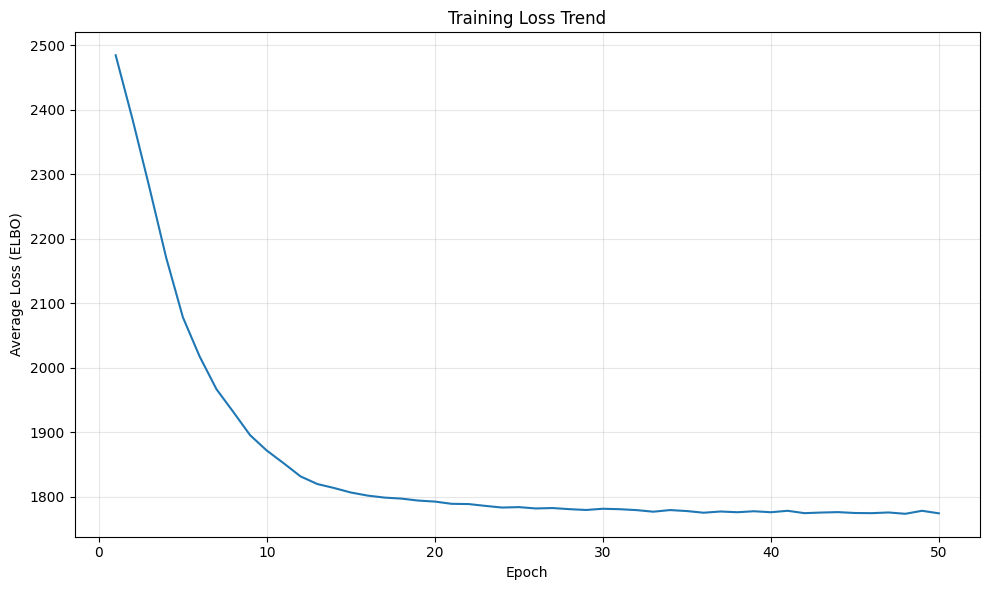

In [ ]:
import math
import torch
import pyro
from tqdm import trange
from pyro.infer import SVI, TraceEnum_ELBO
from pyro.optim import ClippedAdam

# -------------------------
# Global Setup
# -------------------------
seed = 0
torch.manual_seed(seed)
pyro.set_rng_seed(seed)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

num_topics = 50
cells = cells.to(device)
batch_size = 32

# === Stability fix ===
# **Changed** lower learning rate for stable optimization
learning_rate = 5e-4
num_epochs = 50

# -------------------------
# Model Instantiation
# -------------------------
pyro.clear_param_store()

prodLDA = ProdLDA(
    vocab_size=cells.shape[1],
    num_topics=num_topics,
    hidden=100,
    dropout=0.2
)
prodLDA.to(device)
print(prodLDA.to(device))

# -------------------------
# Optimizer and SVI Setup
# -------------------------
# === Stability fix ===
# **Changed** use gradient-clipped Adam with adjusted betas
optimizer = ClippedAdam({"lr": learning_rate, "betas": (0.8, 0.99)})

# === Stability fix ===
# **Changed** use TraceEnum_ELBO for reduced gradient variance
svi = SVI(
    prodLDA.model,
    prodLDA.guide,
    optimizer,
    loss=TraceEnum_ELBO(max_plate_nesting=1)
)

num_batches = int(np.ceil(cells.shape[0] / batch_size))

# -------------------------
# KL Annealing Function
# -------------------------
# === Stability fix ===
# **Changed** ramp up KL term slowly
def kl_weight(step, n_warmup=1000):
    return min(1.0, step / n_warmup)

# -------------------------
# Training Loop
# -------------------------
global_step = 0
bar = trange(num_epochs)

losses = []
for epoch in bar:
    running_loss = 0.0
    for i in range(num_batches):
        batch_cells = cells[i * batch_size:(i + 1) * batch_size, :]

        # === Stability fix ===
        # **Changed** pass kl_weight to guide
        kl = max(kl_weight(global_step), 1e-8)  # === Stability fix ===
        loss = svi.step(batch_cells, kl)
        running_loss += loss / batch_cells.size(0)
        global_step += 1

    epoch_loss = running_loss / num_batches  # Properly average the loss
    losses.append(epoch_loss)
    bar.set_postfix(epoch_loss='{:.2e}'.format(epoch_loss))

# After training, plot the loss curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(losses)+1), losses)
plt.xlabel('Epoch')
plt.ylabel('Average Loss (ELBO)')
plt.title('Training Loss Trend')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('loss_trend.png', dpi=300)
plt.show()

##### Extract Tables

In [ ]:
def extract_topic_gene_table(model, gene_names):
    """
    Extract the topic-gene matrix from the trained model and convert to probabilities.

    Args:
        model: Trained ProdLDA model
        gene_names: List of gene names

    Returns:
        DataFrame: A table with topics as rows and genes as columns, containing probability distributions
    """
    # Get the beta matrix (topics x genes)
    beta_matrix = model.beta()  # This returns a tensor

    # Apply softmax along gene dimension (dim=1) to get probability distributions
    # Each row (topic) will sum to 1 after this operation
    topic_gene_probs = F.softmax(beta_matrix, dim=1).cpu().detach().numpy()

    # Create a DataFrame
    topic_gene_df = pd.DataFrame(
        topic_gene_probs,
        index=[f"Topic_{i+1}" for i in range(topic_gene_probs.shape[0])],
        columns=gene_names
    )

    return topic_gene_df

# Usage example:
# After training your model, extract the table:
topic_gene_df = extract_topic_gene_table(prodLDA, gene_names)
topic_gene_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/topic_gene_df.csv')

In [ ]:
print(topic_gene_df.head())

           S100A9    S100A8      NKG7      GNLY      GZMB      FCN1    LGALS2  \
Topic_1  0.000683  0.000733  0.000460  0.000469  0.000478  0.000578  0.000589   
Topic_2  0.000386  0.000395  0.000403  0.000406  0.000442  0.000453  0.000505   
Topic_3  0.000472  0.000426  0.000468  0.000452  0.000460  0.000488  0.000510   
Topic_4  0.000430  0.000421  0.000468  0.000438  0.000443  0.000427  0.000442   
Topic_5  0.000400  0.000399  0.000419  0.000416  0.000430  0.000416  0.000439   

           FCGR3A    IFITM3     CD79A  ...  PPP1R14A      XCL1     S1PR5  \
Topic_1  0.000459  0.000532  0.000469  ...  0.000534  0.000533  0.000529   
Topic_2  0.000450  0.000484  0.000518  ...  0.000524  0.000519  0.000527   
Topic_3  0.000422  0.000466  0.000511  ...  0.000523  0.000499  0.000486   
Topic_4  0.000446  0.000384  0.000447  ...  0.000507  0.000509  0.000507   
Topic_5  0.000427  0.000419  0.000432  ...  0.000502  0.000501  0.000498   

            LYPD2     SPARC     FCRL6  KIAA0125      CST

In [ ]:
# 2. Extract cell-topic distribution
def extract_cell_topic_table(model, cell_gene_data, cell_ids=None):
    """
    Extract the cell-topic distribution from the trained model.

    Args:
        model: Trained ProdLDA model
        cell_gene_data: Input data tensor (cells x genes)
        cell_ids: List of cell identifiers (optional)

    Returns:
        DataFrame: A table with cells as rows and topics as columns
    """
    # Set model to evaluation mode
    model.eval()

    # Get the logtheta parameters for each cell
    with torch.no_grad():
        logtheta_loc, logtheta_scale = model.encoder(cell_gene_data)

    # Get cell-topic distributions
    cell_topics = F.softmax(logtheta_loc, dim=1).cpu().detach()

    df_cell_topics = pd.DataFrame(cell_topics.numpy())
    df_cell_topics.index = cell_names
    df_cell_topics.columns = [f"Topic_{i+1}" for i in range(num_topics)]

    return df_cell_topics

cell_topic_df = extract_cell_topic_table(prodLDA, cells)
cell_topic_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/cell_topic_df.csv')

In [ ]:
print(cell_topic_df.head())

                   Topic_1   Topic_2   Topic_3   Topic_4   Topic_5   Topic_6  \
AAACATACAACCAC-1  0.007321  0.013837  0.008397  0.051493  0.030611  0.066301   
AAACATTGAGCTAC-1  0.004565  0.003553  0.071394  0.006671  0.006115  0.003453   
AAACATTGATCAGC-1  0.005585  0.004139  0.008334  0.076766  0.053700  0.032563   
AAACCGTGCTTCCG-1  0.026521  0.008461  0.016018  0.004912  0.004663  0.004211   
AAACCGTGTATGCG-1  0.014773  0.045495  0.002847  0.003179  0.003598  0.008414   

                   Topic_7   Topic_8   Topic_9  Topic_10  ...  Topic_41  \
AAACATACAACCAC-1  0.007565  0.026356  0.025049  0.006950  ...  0.006570   
AAACATTGAGCTAC-1  0.016650  0.003934  0.002806  0.146843  ...  0.014031   
AAACATTGATCAGC-1  0.004099  0.012699  0.005506  0.005150  ...  0.005331   
AAACCGTGCTTCCG-1  0.008659  0.006211  0.007159  0.008432  ...  0.063990   
AAACCGTGTATGCG-1  0.007753  0.007649  0.067695  0.004768  ...  0.004312   

                  Topic_42  Topic_43  Topic_44  Topic_45  Topic_46  

### Cell Cluster


Finding optimal number of clusters...
For n_clusters = 2, the silhouette score is 0.2063
For n_clusters = 3, the silhouette score is 0.2496
For n_clusters = 4, the silhouette score is 0.3146
For n_clusters = 5, the silhouette score is 0.3975
For n_clusters = 6, the silhouette score is 0.4377
For n_clusters = 7, the silhouette score is 0.3802
For n_clusters = 8, the silhouette score is 0.3979
For n_clusters = 9, the silhouette score is 0.4090
For n_clusters = 10, the silhouette score is 0.4039
For n_clusters = 11, the silhouette score is 0.4163
For n_clusters = 12, the silhouette score is 0.4034
For n_clusters = 13, the silhouette score is 0.3697
For n_clusters = 14, the silhouette score is 0.3631
For n_clusters = 15, the silhouette score is 0.3631


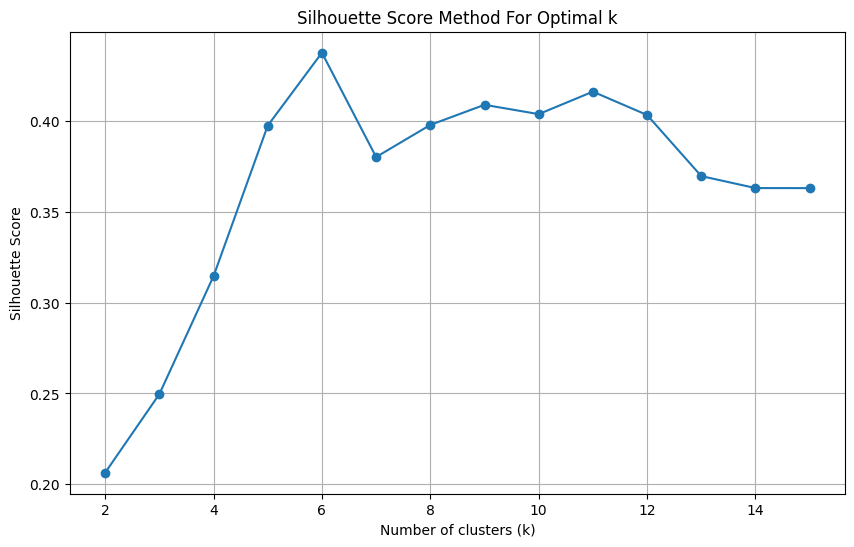

Optimal number of clusters: 6


In [ ]:
# Find optimal number of clusters using silhouette score
def find_optimal_clusters(embeddings_df, max_clusters=15):
    silhouette_scores = []

    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(embeddings_df.values)

        # Calculate silhouette score
        silhouette_avg = silhouette_score(embeddings_df.values, cluster_labels)
        silhouette_scores.append(silhouette_avg)

        print(f"For n_clusters = {n_clusters}, the silhouette score is {silhouette_avg:.4f}")

    # Plot silhouette scores
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Score Method For Optimal k')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

    # Return the optimal number of clusters
    optimal_clusters = np.argmax(silhouette_scores) + 2  # +2 because we start from 2
    return optimal_clusters

# Find optimal number of clusters
print("\nFinding optimal number of clusters...")
optimal_k = find_optimal_clusters(cell_topic_df, max_clusters=15)
print(f"Optimal number of clusters: {optimal_k}")

In [ ]:
# KMeans clustering on cell-topic distribution
kmeans = KMeans(n_clusters=6, random_state=42, n_init=6)
clusters = kmeans.fit_predict(cell_topic_df)

# UMAP for visualization
umap_reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
umap_result = umap_reducer.fit_transform(cell_topic_df)

# Create a DataFrame for plotting
umap_df = pd.DataFrame({
    'UMAP1': umap_result[:, 0],
    'UMAP2': umap_result[:, 1],
    'Cluster': clusters
}, index=cell_topic_df.index)

print(umap_df.head())

# Save umap_df
umap_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_lda.csv')

score = silhouette_score(cell_topic_df, clusters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


                      UMAP1      UMAP2  Cluster
AAACATACAACCAC-1  -2.629990   1.948239        1
AAACATTGAGCTAC-1   0.856815  12.214233        4
AAACATTGATCAGC-1  -3.892982   5.800243        1
AAACCGTGCTTCCG-1  11.639882   4.487644        5
AAACCGTGTATGCG-1  -0.464015   0.084655        3
Silhouette Score: 0.438


In [ ]:
umap_df_lda = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_lda.csv', index_col=0)
print(umap_df_lda.head())

                      UMAP1      UMAP2  Cluster
AAACATACAACCAC-1  -2.629990   1.948239        1
AAACATTGAGCTAC-1   0.856815  12.214233        4
AAACATTGATCAGC-1  -3.892983   5.800243        1
AAACCGTGCTTCCG-1  11.639882   4.487644        5
AAACCGTGTATGCG-1  -0.464015   0.084655        3


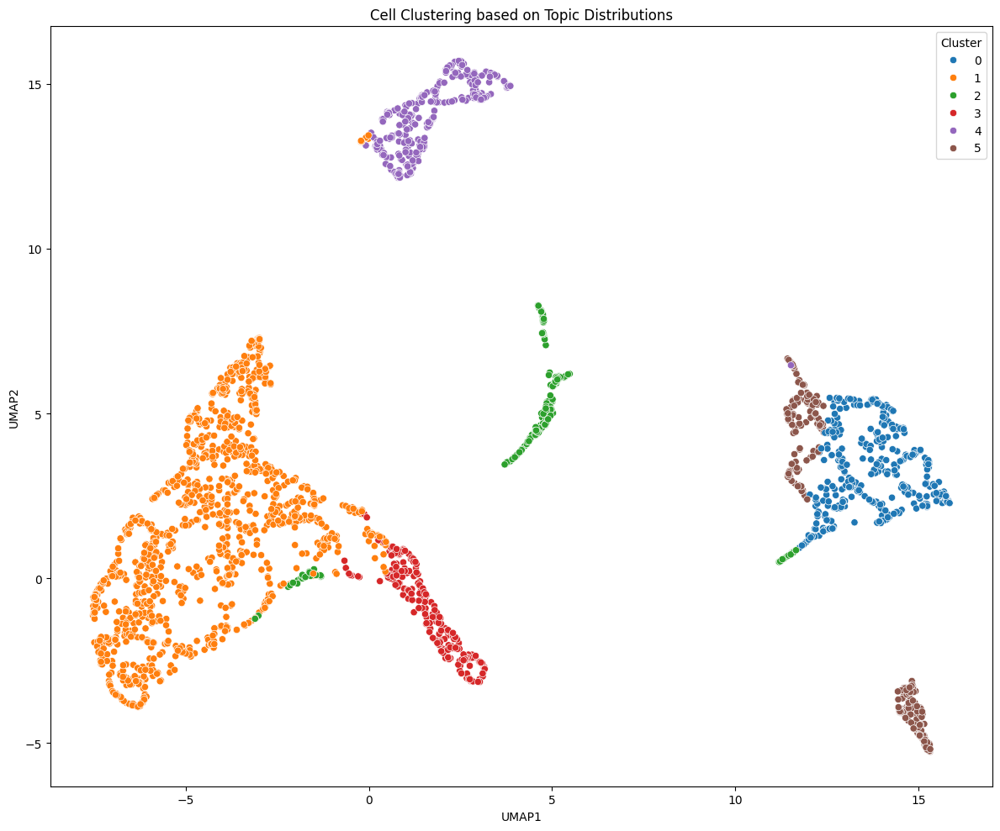

In [ ]:
# Plot final clustering
plt.figure(figsize=(12, 10))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Cluster', palette='tab10')
plt.title('Cell Clustering based on Topic Distributions')
plt.tight_layout()
plt.savefig(f'/content/drive/MyDrive/Capstone/{version}/cell_clusters_tsne.png')
plt.show()

In [ ]:
# KMeans clustering on cell-topic distribution
kmeans = KMeans(n_clusters=6, random_state=42, n_init=6)
clusters = kmeans.fit_predict(cell_topic_df)

# t-SNE for visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_result = tsne.fit_transform(cell_topic_df)

# Create a DataFrame for plotting with the same column names as your example
tsne_df = pd.DataFrame({
    'tSNE1': tsne_result[:, 0],
    'tSNE2': tsne_result[:, 1],
    'Cluster': clusters
}, index=cell_topic_df.index)

print(tsne_df.head())

# Save tsne_df
tsne_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/tsne_df_lda.csv')

score = silhouette_score(cell_topic_df, clusters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1  22.622913  -7.715371        1
AAACATTGAGCTAC-1 -57.697918   6.201319        4
AAACATTGATCAGC-1  12.620198  16.633926        1
AAACCGTGCTTCCG-1 -10.320934  43.955437        5
AAACCGTGTATGCG-1  49.852753  -6.863467        3
Silhouette Score: 0.438


In [ ]:
tsne_df_lda = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/tsne_df_lda.csv', index_col=0)
print(tsne_df_lda.head())

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1  22.622913  -7.715371        1
AAACATTGAGCTAC-1 -57.697918   6.201319        4
AAACATTGATCAGC-1  12.620198  16.633926        1
AAACCGTGCTTCCG-1 -10.320934  43.955437        5
AAACCGTGTATGCG-1  49.852753  -6.863467        3


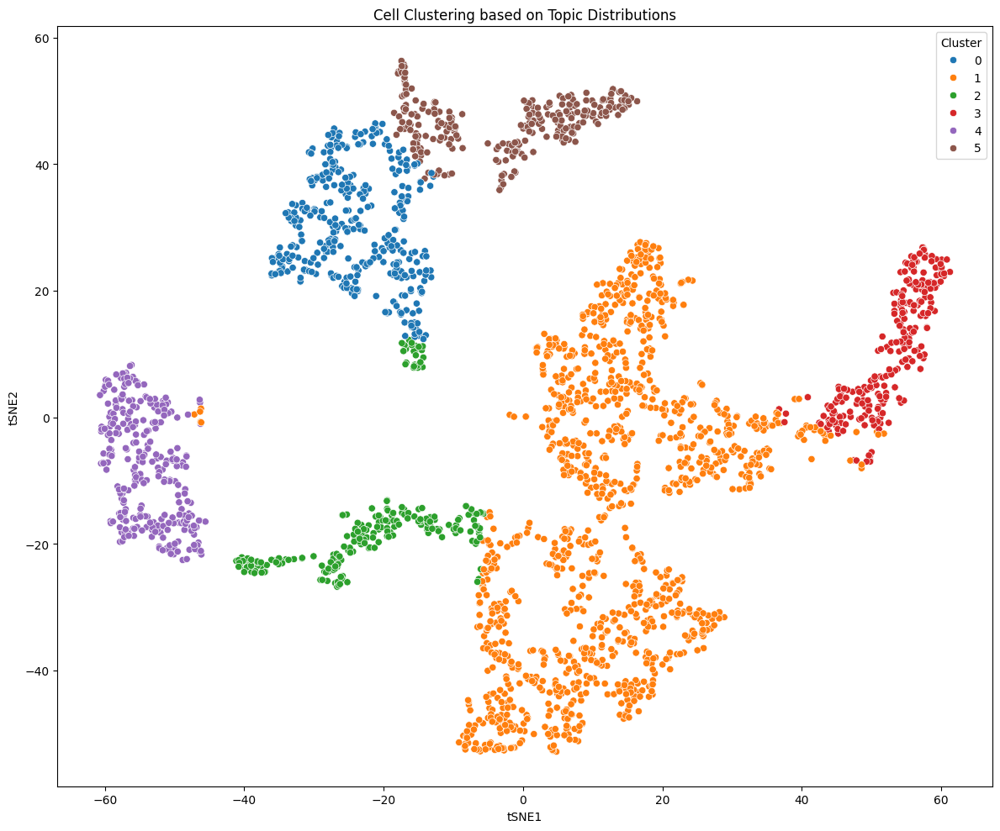

In [ ]:
# Plot final clustering
plt.figure(figsize=(12, 10))
sns.scatterplot(data=tsne_df, x='tSNE1', y='tSNE2', hue='Cluster', palette='tab10')
plt.title('Cell Clustering based on Topic Distributions')
plt.tight_layout()
plt.savefig(f'/content/drive/MyDrive/Capstone/{version}/cell_clusters_tsne.png')
plt.show()

#### Compare Clusters Function

In [ ]:
tsne_df_lda = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/tsne_df_lda.csv', index_col=0)
print(tsne_df_lda.head())

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1  22.622913  -7.715371        1
AAACATTGAGCTAC-1 -57.697918   6.201319        4
AAACATTGATCAGC-1  12.620198  16.633926        1
AAACCGTGCTTCCG-1 -10.320934  43.955437        5
AAACCGTGTATGCG-1  49.852753  -6.863467        3


In [ ]:
seurat_clusters = pd.read_csv("/content/drive/MyDrive/Capstone/pbmc_metadata.csv", index_col=0)
print(seurat_clusters[["seurat_clusters"]].head())

                  seurat_clusters
AAACATACAACCAC-1                2
AAACATTGAGCTAC-1                3
AAACATTGATCAGC-1                2
AAACCGTGCTTCCG-1                1
AAACCGTGTATGCG-1                6


In [ ]:
# Example usage:
contingency_table = compare_clusters(umap_df_lda, seurat_clusters)
print(contingency_table)

Adjusted Rand Index: 0.4582
Normalized Mutual Information: 0.6460

Contingency Table (rows: tSNE clusters, columns: Seurat clusters):
seurat_cluster    0    1    2    3    4    5    6   7   8  Total
tsne_cluster                                                    
0                 0  367    0    0    0    1    0   1   0    369
1               581    0  473    9  161    0    2   1   1   1228
2               103   37    3   43   37    2    0   0  11    236
3                 0    0    0    0   93    0  153   0   0    246
4                 0    0    0  292    0    0    0   2   0    294
5                 0   77    0    0    0  159    0  28   1    265
Total           684  481  476  344  291  162  155  32  13   2638


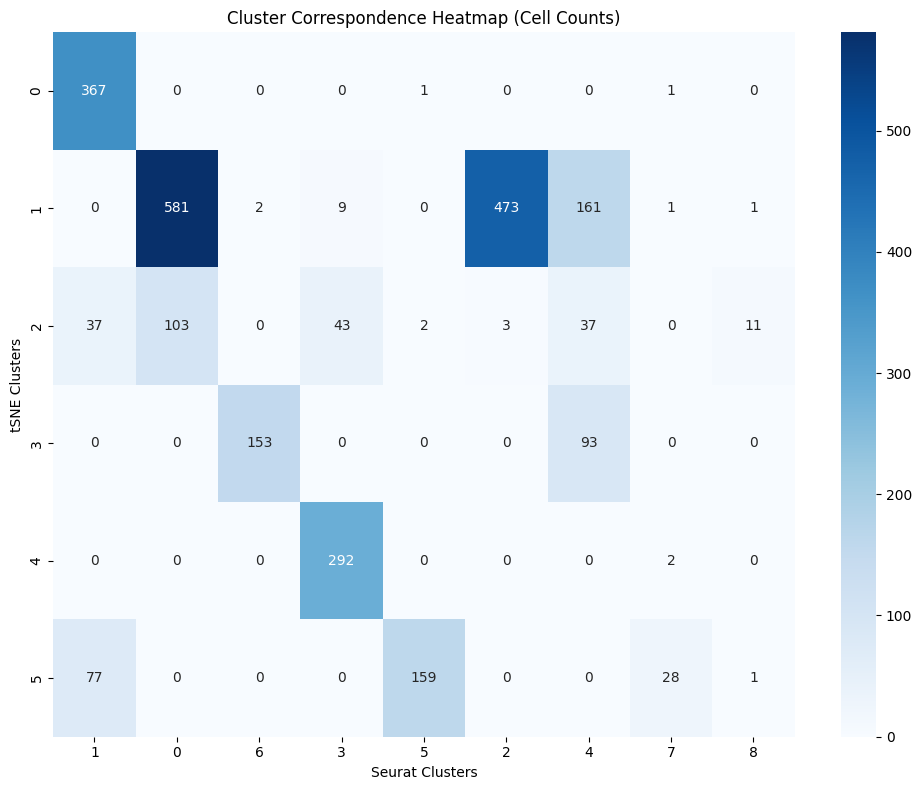

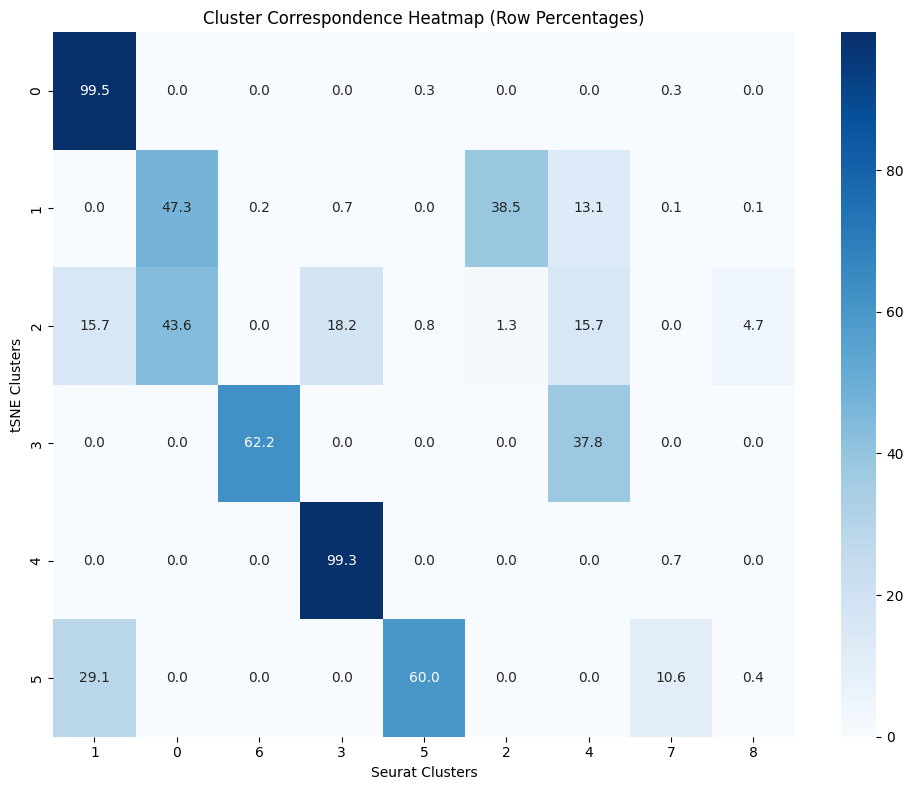

In [ ]:
# Plot sorted heatmaps
counts, percentages = plot_heatmaps(contingency_table)

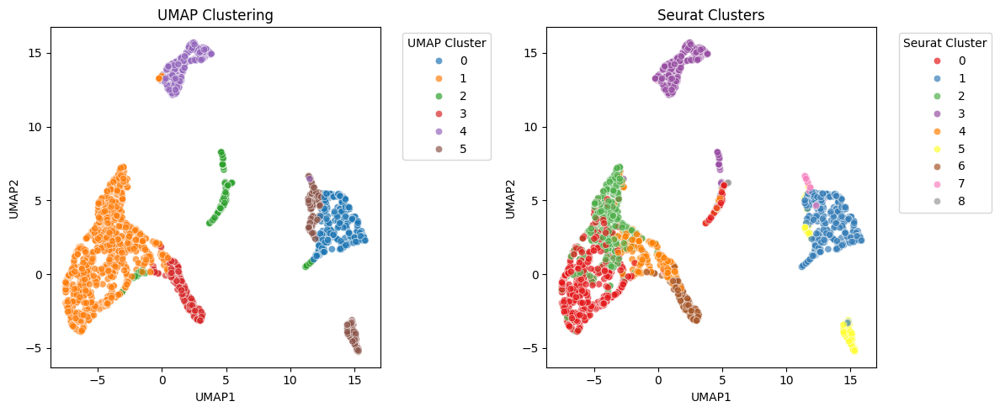

In [ ]:
plot_cluster_comparison_umap(umap_df_lda, seurat_clusters)

In [ ]:
# Create a sankey diagram for cluster flow
try:
    import plotly.graph_objects as go
    from plotly.offline import plot

    # Prepare data for Sankey diagram
    source = []
    target = []
    value = []

    for i, row in contingency_table.iterrows():
        if i != 'Total':
            for j, count in row.items():
                if j != 'Total' and count > 0:
                    source.append(i)  # Your cluster
                    target.append(j + 9)  # Seurat cluster (offset by 9 to avoid overlap)
                    value.append(count)

    # Create node labels
    node_labels = [f"Your Cluster {i}" for i in range(9)] + [f"Seurat Cluster {i}" for i in range(9)]

    # Create Sankey diagram
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=node_labels
        ),
        link=dict(
            source=source,
            target=target,
            value=value
        )
    )])

    fig.update_layout(
        title_text="Cluster Correspondence Flow",
        font_size=12,
        height=800
    )

    # Save the figure to a file
    fig.write_html(f"/content/drive/MyDrive/Capstone/{version}/cluster_flow_lda.html")
    print("\nSankey diagram saved to 'cluster_flow.html'")
except ImportError:
    print("\nCouldn't create Sankey diagram - plotly not available")


Sankey diagram saved to 'cluster_flow.html'


#### Word Cloud

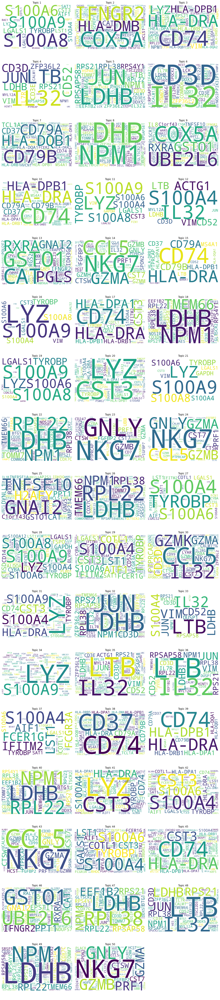

In [ ]:
def plot_gene_cloud(beta_row, ax, vocab, n):
    sorted_, indices = torch.sort(beta_row, descending=True)
    df = pd.DataFrame(indices[:100].cpu().numpy(), columns=['index'])
    genes = pd.merge(df, vocab[['index', 'gene']], how='left', on='index')['gene'].values.tolist()
    sizes = (sorted_[:100] * 1000).int().cpu().numpy().tolist()
    freqs = {genes[i]: sizes[i] for i in range(len(genes))}
    wc = WordCloud(background_color="white", width=800, height=500)
    wc = wc.generate_from_frequencies(freqs)
    ax.set_title(f'Topic {n + 1}')
    ax.imshow(wc, interpolation='bilinear')
    ax.axis("off")

# Get beta (topics x genes)
beta = prodLDA.beta()

n_cols = 3
n_rows = int(np.ceil(num_topics / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))

for n in range(num_topics):
    i, j = divmod(n, n_cols)
    plot_gene_cloud(beta[n], axs[i, j], vocab, n)

# Hide any unused subplots
for k in range(num_topics, n_rows * n_cols):
    i, j = divmod(k, n_cols)
    axs[i, j].axis('off')

plt.tight_layout()
plt.show()

#### Analyze Topcis in Cluster

##### Get Top 10 Topics for Each Cluster

In [ ]:
# ----- ANALYZE THE IMPORTANCE OF TOPICS FOR EACH CLUSTER -----
cluster_topic_importance = pd.DataFrame()
for cluster in range(6):
    # Get cells in this cluster (now cell names)
    cluster_cells = tsne_df_lda[tsne_df_lda['Cluster'] == cluster].index
    # Intersect for safety
    cluster_cells = cell_topic_df.index.intersection(cluster_cells)
    # Calculate mean topic distribution for these cells
    cluster_topic_means = cell_topic_df.loc[cluster_cells].mean()
    cluster_topic_importance[f'Cluster_{cluster}'] = cluster_topic_means

cluster_topic_importance.to_csv(f'/content/drive/MyDrive/Capstone/{version}/cluster_topic_importance.csv')
print(cluster_topic_importance.head())

         Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5
Topic_1   0.081679   0.008917   0.025117   0.006821   0.008376   0.017179
Topic_2   0.009428   0.011435   0.100426   0.007336   0.027881   0.006639
Topic_3   0.011692   0.009739   0.004358   0.005546   0.033181   0.034281
Topic_4   0.004444   0.034830   0.007333   0.009855   0.009477   0.004211
Topic_5   0.004364   0.034830   0.006256   0.005569   0.008678   0.003893


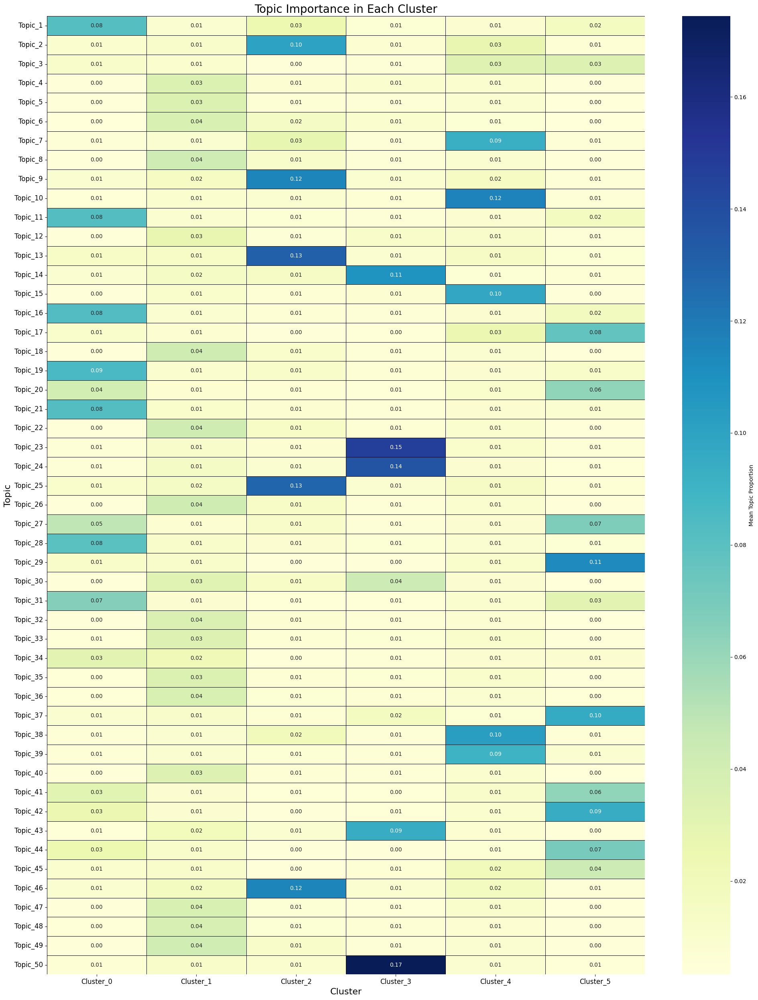

In [ ]:
plt.figure(figsize=(20, len(cluster_topic_importance)/2))  # Adjust width and height dynamically
sns.heatmap(cluster_topic_importance,
            cmap="YlGnBu",
            annot=True,       # Display values
            fmt=".2f",        # Format values to 2 decimal places
            linewidths=.5,    # Add lines between cells
            linecolor="black",  # Line color
            cbar_kws={'label': 'Mean Topic Proportion'}) # Colorbar label

plt.title('Topic Importance in Each Cluster', fontsize=20)  # Title
plt.xlabel('Cluster', fontsize=16)                  # X label
plt.ylabel('Topic', fontsize=16)                    # Y label

plt.xticks(fontsize=12)  # X tick font size
plt.yticks(fontsize=12, rotation=0)  # Y tick font size, no rotation

plt.tight_layout()
# plt.savefig('cluster_topic_heatmap_improved.png', bbox_inches='tight') # Save
plt.show()

          Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5
Topic_50   0.006392   0.012237   0.009990   0.174400   0.008903   0.005182
Topic_23   0.005511   0.011553   0.007975   0.147417   0.010292   0.005883
Topic_24   0.005356   0.014703   0.008886   0.136592   0.008127   0.005150
Topic_13   0.013546   0.013892   0.130325   0.008832   0.014221   0.007141
Topic_25   0.010849   0.015219   0.128021   0.008990   0.014603   0.006509


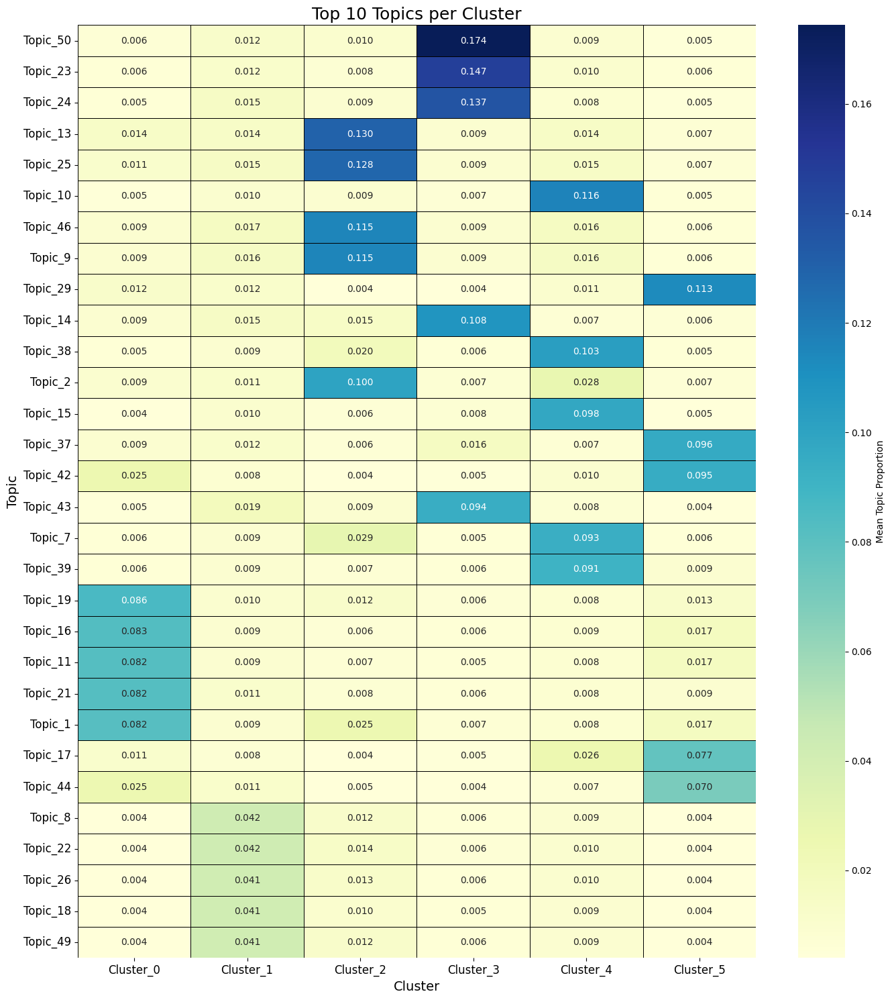

In [ ]:
# cluster_topic_importance: DataFrame with topics as rows, clusters as columns (after .T)
# We'll build a mask of the top 10 topics per cluster
top_n = 5
top_topics = set()

for cluster in cluster_topic_importance.columns:
    # Get the top 10 topics (row labels) for this cluster
    top = cluster_topic_importance[cluster].nlargest(top_n).index
    top_topics.update(top)

# Subset the DataFrame to only these topics
top_topics = list(top_topics)
focused_df = cluster_topic_importance.loc[top_topics]

# Sort topics by their maximum value across clusters
focused_df = focused_df.loc[focused_df.max(axis=1).sort_values(ascending=False).index]

focused_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/focused_df.csv')
print(focused_df.head())

plt.figure(figsize=(14, max(6, 0.5 * len(focused_df))))  # Adjust height to number of topics
sns.heatmap(
    focused_df,
    cmap="YlGnBu",
    annot=True,
    fmt=".3f",
    linewidths=0.5,
    linecolor="black",
    cbar_kws={'label': 'Mean Topic Proportion'}
)
plt.title('Top 10 Topics per Cluster', fontsize=18)
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Topic', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
# plt.savefig('top10_topics_per_cluster_heatmap.png', bbox_inches='tight')
plt.show()


#### Pathway Analysis

##### Get Top 5 Genes Each Topic

In [ ]:
topic_gene_df = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/topic_gene_df.csv',index_col=0)
print(topic_gene_df.head())

           S100A9    S100A8      NKG7      GNLY      GZMB      FCN1    LGALS2  \
Topic_1  0.000683  0.000733  0.000460  0.000469  0.000478  0.000578  0.000589   
Topic_2  0.000386  0.000395  0.000403  0.000406  0.000442  0.000453  0.000505   
Topic_3  0.000472  0.000426  0.000468  0.000452  0.000460  0.000488  0.000510   
Topic_4  0.000430  0.000421  0.000468  0.000438  0.000443  0.000427  0.000442   
Topic_5  0.000400  0.000399  0.000419  0.000416  0.000430  0.000416  0.000439   

           FCGR3A    IFITM3     CD79A  ...  PPP1R14A      XCL1     S1PR5  \
Topic_1  0.000459  0.000532  0.000469  ...  0.000534  0.000533  0.000529   
Topic_2  0.000450  0.000484  0.000518  ...  0.000524  0.000519  0.000527   
Topic_3  0.000422  0.000466  0.000511  ...  0.000523  0.000499  0.000486   
Topic_4  0.000446  0.000384  0.000447  ...  0.000507  0.000509  0.000507   
Topic_5  0.000427  0.000419  0.000432  ...  0.000502  0.000501  0.000498   

            LYPD2     SPARC     FCRL6  KIAA0125      CST

In [ ]:
import pandas as pd

top_n = 5  # Number of top genes per topic

topic_top_gene = {}

for topic_id in topic_gene_df.index:
    # Get top N genes and their probabilities for this topic
    sorted_genes = topic_gene_df.loc[topic_id].sort_values(ascending=False).head(top_n)
    topic_key = f"Topic_{topic_id}" if not str(topic_id).startswith("Topic_") else topic_id
    # Store as list of (gene, probability) tuples
    topic_top_gene[topic_key] = list(zip(sorted_genes.index, sorted_genes.values))

# Convert to DataFrame
topic_top_gene_df = pd.DataFrame.from_dict(topic_top_gene, orient='index')

# Rename columns for clarity
topic_top_gene_df.columns = [f'TopGene_{i+1}' for i in range(topic_top_gene_df.shape[1])]

# Split tuples into separate columns for gene and probability
for i in range(top_n):
    topic_top_gene_df[[f'TopGene_{i+1}', f'Prob_{i+1}']] = pd.DataFrame(topic_top_gene_df[f'TopGene_{i+1}'].tolist(), index=topic_top_gene_df.index)

print(topic_top_gene_df.head())


        TopGene_1 TopGene_2 TopGene_3 TopGene_4 TopGene_5    Prob_1    Prob_2  \
Topic_1    S100A8    S100A9    S100A6    TYROBP    LGALS1  0.000733  0.000683   
Topic_2     COX5A    IFNGR2   HLA-DMB       CAT     REEP5  0.000559  0.000555   
Topic_3      CD74   HLA-DRA       LYZ  HLA-DPB1  HLA-DRB1  0.000831  0.000793   
Topic_4      IL32       LTB       JUN      CD52      CD3D  0.000654  0.000631   
Topic_5      LDHB       JUN      NPM1   RPSAP58     RPL38  0.000616  0.000608   

           Prob_3    Prob_4    Prob_5  
Topic_1  0.000668  0.000667  0.000654  
Topic_2  0.000554  0.000553  0.000552  
Topic_3  0.000680  0.000652  0.000639  
Topic_4  0.000599  0.000583  0.000581  
Topic_5  0.000601  0.000594  0.000593  


In [ ]:
topic_top_gene_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/topic_top_gene_df.csv')

In [ ]:
topic_top_gene_df = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/topic_top_gene_df.csv', index_col=0)
print(topic_top_gene_df.head())

        TopGene_1 TopGene_2 TopGene_3 TopGene_4 TopGene_5    Prob_1    Prob_2  \
Topic_1    S100A8    S100A9    S100A6    TYROBP    LGALS1  0.000733  0.000683   
Topic_2     COX5A    IFNGR2   HLA-DMB       CAT     REEP5  0.000559  0.000555   
Topic_3      CD74   HLA-DRA       LYZ  HLA-DPB1  HLA-DRB1  0.000831  0.000793   
Topic_4      IL32       LTB       JUN      CD52      CD3D  0.000654  0.000631   
Topic_5      LDHB       JUN      NPM1   RPSAP58     RPL38  0.000616  0.000608   

           Prob_3    Prob_4    Prob_5  
Topic_1  0.000668  0.000667  0.000654  
Topic_2  0.000554  0.000553  0.000552  
Topic_3  0.000680  0.000652  0.000639  
Topic_4  0.000599  0.000583  0.000581  
Topic_5  0.000601  0.000594  0.000593  


In [ ]:
topic_top_gene_df.shape

(50, 10)

##### Get Topic Enrich Table

In [ ]:
import gseapy as gp

enrichment_results = {}

# Specify the gene columns to use
top_gene_cols = [f'TopGene_{i+1}' for i in range(5)]  # ['TopGene_1', ..., 'TopGene_5']

# Iterate over DataFrame rows
for topic, row in topic_top_gene_df.iterrows():
    genes = row[top_gene_cols].dropna().tolist()  # Get only the top gene columns
    enr = gp.enrichr(
        gene_list=genes,
        gene_sets=['KEGG_2021_Human'],
        organism='Human'
    )
    enrichment_results[topic] = enr.results

# Combine all results into one DataFrame, adding a 'Topic' column
all_enrich_df = pd.concat(
    [df.assign(Topic=topic) for topic, df in enrichment_results.items()],
    ignore_index=True
)

print(all_enrich_df.head())

          Gene_set                                       Term Overlap  \
0  KEGG_2021_Human                    IL-17 signaling pathway    2/94   
1  KEGG_2021_Human                 Osteoclast differentiation   1/127   
2  KEGG_2021_Human  Natural killer cell mediated cytotoxicity   1/131   
3  KEGG_2021_Human                 Inflammatory bowel disease    2/65   
4  KEGG_2021_Human                              Leishmaniasis    2/77   

    P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0  0.000217          0.000650            0                     0  144.224638   
1  0.031352          0.032327            0                     0   39.422619   
2  0.032327          0.032327            0                     0   38.201923   
3  0.000103          0.003013            0                     0  210.920635   
4  0.000145          0.003013            0                     0  177.066667   

   Combined Score           Genes    Topic  
0     1216.923048   S100A9;S100A8  

In [ ]:
all_enrich_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/all_enrich_df.csv')

In [ ]:
all_enrich_df = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/all_enrich_df.csv', index_col=0)
print(all_enrich_df.head())

          Gene_set                                       Term Overlap  \
0  KEGG_2021_Human                    IL-17 signaling pathway    2/94   
1  KEGG_2021_Human                 Osteoclast differentiation   1/127   
2  KEGG_2021_Human  Natural killer cell mediated cytotoxicity   1/131   
3  KEGG_2021_Human                 Inflammatory bowel disease    2/65   
4  KEGG_2021_Human                              Leishmaniasis    2/77   

    P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0  0.000217          0.000650            0                     0  144.224638   
1  0.031352          0.032327            0                     0   39.422619   
2  0.032327          0.032327            0                     0   38.201923   
3  0.000103          0.003013            0                     0  210.920635   
4  0.000145          0.003013            0                     0  177.066667   

   Combined Score           Genes    Topic  
0     1216.923048   S100A9;S100A8  

##### Word Cloud for Term in Each Topic

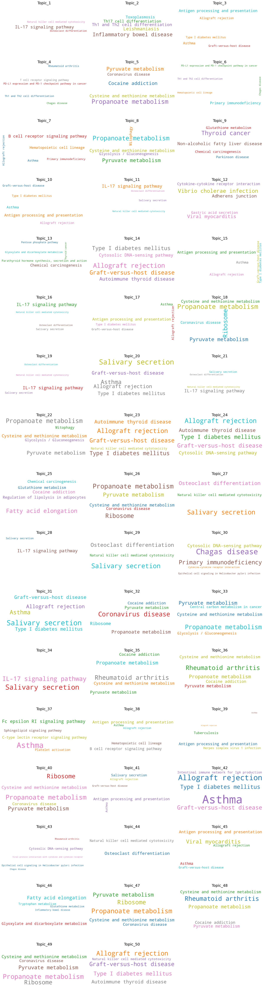

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd
import numpy as np

# Example: use your actual DataFrame
# all_enrich_df = pd.read_csv('your_file.csv')

# Get unique topics
topics = all_enrich_df['Topic'].unique()
n_topics = len(topics)

n_cols = 3
n_rows = int(np.ceil(n_topics / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))

if n_topics == 1:
    axs = np.array([[axs]])

for idx, topic in enumerate(topics):
    i, j = divmod(idx, n_cols)
    ax = axs[i, j] if n_topics > 1 else axs[0, 0]

    topic_df = all_enrich_df[all_enrich_df['Topic'] == topic]
    # Keep only the top 5 by Combined Score
    top5 = topic_df.nlargest(5, 'Combined Score')
    freqs = dict(zip(top5['Term'], top5['Combined Score']))

    wc = WordCloud(width=800, height=400, background_color="white", colormap='tab10')
    wc.generate_from_frequencies(freqs)

    ax.imshow(wc, interpolation='bilinear')
    ax.set_title(f"{topic}", fontsize=18)
    ax.axis('off')

# Hide any unused subplots
for k in range(n_topics, n_rows * n_cols):
    i, j = divmod(k, n_cols)
    axs[i, j].axis('off')

plt.tight_layout()
plt.show()


##### Get Pathway for Each Cluster

In [ ]:
cluster_topic_importance = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/cluster_topic_importance.csv',index_col=0)
print(cluster_topic_importance.head())

         Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5
Topic_1   0.081679   0.008917   0.025117   0.006821   0.008376   0.017179
Topic_2   0.009428   0.011435   0.100426   0.007336   0.027881   0.006639
Topic_3   0.011692   0.009739   0.004358   0.005546   0.033181   0.034281
Topic_4   0.004444   0.034830   0.007333   0.009855   0.009477   0.004211
Topic_5   0.004364   0.034830   0.006256   0.005569   0.008678   0.003893


In [ ]:
# Step 1: Get top 5 topics per cluster
cti_long = (
    cluster_topic_importance
    .reset_index()
    .melt(id_vars='index', var_name='Cluster_ID', value_name='Topic_Prob')
    .rename(columns={'index': 'Topic'})
)
cti_long['Cluster_ID'] = cti_long['Cluster_ID'].astype(str)  # Ensure consistent typing

top_topics = (
    cti_long
    .groupby('Cluster_ID', group_keys=False)
    .apply(lambda x: x.nlargest(5, 'Topic_Prob'))
)

# Step 2: Get top 5 terms per topic-cluster combination
merged_terms = (
    top_topics
    .merge(all_enrich_df, on='Topic', how='inner')
    .groupby(['Cluster_ID', 'Topic'], group_keys=False)
    .apply(lambda x: x.nlargest(5, 'Combined Score'))
)

# Step 3: Add top genes and format final table
final_table = (
    merged_terms
    .merge(topic_top_gene_df.reset_index().rename(columns={'index': 'Topic'}),
           on='Topic', how='left')
    [['Cluster_ID', 'Topic', 'Topic_Prob',
      'TopGene_1', 'TopGene_2', 'TopGene_3', 'TopGene_4', 'TopGene_5','Prob_1','Prob_2','Prob_3','Prob_4','Prob_5',
      'Term', 'Genes', 'Combined Score']]
    .sort_values(['Cluster_ID', 'Topic_Prob'], ascending=[True, False])
    .reset_index(drop=True)
)

<ipython-input-23-af1903e33653>:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.

<ipython-input-23-af1903e33653>:21: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
final_table.to_csv(f"/content/drive/MyDrive/Capstone/{version}/cluster_topic_gene_pathway_lda.csv")

In [ ]:
cluster_topic_gene_pathway_lda = pd.read_csv(f"/content/drive/MyDrive/Capstone/{version}/cluster_topic_gene_pathway_lda.csv", index_col=0)
print(cluster_topic_gene_pathway_lda.head())

  Cluster_ID     Topic  Topic_Prob TopGene_1 TopGene_2 TopGene_3 TopGene_4  \
0  Cluster_0  Topic_19    0.086036    S100A9    S100A8       LYZ    S100A6   
1  Cluster_0  Topic_19    0.086036    S100A9    S100A8       LYZ    S100A6   
2  Cluster_0  Topic_19    0.086036    S100A9    S100A8       LYZ    S100A6   
3  Cluster_0  Topic_19    0.086036    S100A9    S100A8       LYZ    S100A6   
4  Cluster_0  Topic_16    0.083126       LYZ    S100A9    S100A8    S100A4   

  TopGene_5    Prob_1    Prob_2    Prob_3    Prob_4    Prob_5  \
0    TYROBP  0.000815  0.000754  0.000674  0.000664  0.000650   
1    TYROBP  0.000815  0.000754  0.000674  0.000664  0.000650   
2    TYROBP  0.000815  0.000754  0.000674  0.000664  0.000650   
3    TYROBP  0.000815  0.000754  0.000674  0.000664  0.000650   
4    TYROBP  0.001011  0.000786  0.000670  0.000665  0.000655   

                                        Term          Genes  Combined Score  
0                    IL-17 signaling pathway  S100A9;S100A8   

#### Pathway Results

* Cluster_0: Antigen processing and presentation, B cell receptor signaling pathway, Hematopoietic cell lineage

* Cluster_1: Cytokine-cytokine receptor interaction

* Cluster_2: Apoptosis

* Cluster_3: Antigen processing and presentation, Asthma, Tuberculosis

* Cluster_4: Parkinson disease

* Cluster_5: IL-17 signaling pathway

* Cluster_6: Salivary secretion

* Cluster_7: Cytokine-cytokine receptor interaction, Epithelial cell signaling in Helicobacter pylo

* Cluster_8: Ribosome, Coronavirus disease

* Cluster_9: Platelet activation

* Cluster_10: Parkinson disease, B cell receptor signaling pathway, Hematopoietic cell lineage

* Cluster_11



### Graph clustering

Leiden Clustering

You build a k-Nearest Neighbor (k-NN) graph where:

- Nodes = samples (e.g., cells)
- Edges = similarity between cells in latent space (e.g., autoencoder bottleneck)

Leiden partitions this graph into communities (clusters) by:

- Maximizing a modularity (see last class video) or resolution-based objective
- Ensuring well-connected, compact clusters (improves on Louvain's known weaknesses)

In [ ]:
import scanpy as sc
import anndata as ad
import numpy as np

# Assume Z is your bottleneck output: shape (n_cells, 20)

Z = cell_topic_df
print(Z.shape)

adata_latent = ad.AnnData(X=Z)

# Compute neighbors on the 20D latent space
sc.pp.neighbors(adata_latent, n_neighbors=15, use_rep="X") # Higher values (e.g., 20-50): more global, can merge clusters and reduce their number.

# Run Leiden clustering
sc.tl.leiden(adata_latent, resolution=0.4) # more global, can merge clusters and reduce their number., Higher resolution (e.g., 1.0, 2.0): more, smaller clusters.

# Access cluster labels
clusters = adata_latent.obs['leiden']

# Optional visualization using umap (builtin):
# sc.tl.umap(adata_latent)
# sc.pl.umap(adata_latent, color='leiden')


# UMAP for visualization
umap_reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
umap_result = umap_reducer.fit_transform(Z)

# Create a DataFrame for plotting
umap_df = pd.DataFrame({
    'UMAP1': umap_result[:, 0],
    'UMAP2': umap_result[:, 1],
    'Cluster': clusters
}, index=Z.index)

print(umap_df.head())

# Save umap_df
umap_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_leiden.csv')

score = silhouette_score(cell_topic_df, clusters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

(2638, 50)


<ipython-input-44-812cdc4380b0>:16: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_latent, resolution=0.4) # more global, can merge clusters and reduce their number., Higher resolution (e.g., 1.0, 2.0): more, smaller clusters.
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


                      tSNE1      tSNE2 Cluster
AAACATACAACCAC-1  -2.629990   1.948239       3
AAACATTGAGCTAC-1   0.856815  12.214233       6
AAACATTGATCAGC-1  -3.892982   5.800243       1
AAACCGTGCTTCCG-1  11.639882   4.487644       9
AAACCGTGTATGCG-1  -0.464015   0.084655       3
Silhouette Score: 0.318


In [ ]:
umap_df_leiden = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_leiden.csv', index_col=0)
print(umap_df_leiden.head())

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1  -2.106222   1.932584        3
AAACATTGAGCTAC-1   0.543918  13.940084        6
AAACATTGATCAGC-1  -3.513001   5.773539        1
AAACCGTGCTTCCG-1  14.657708   3.581296        9
AAACCGTGTATGCG-1   0.092769   0.107285        3


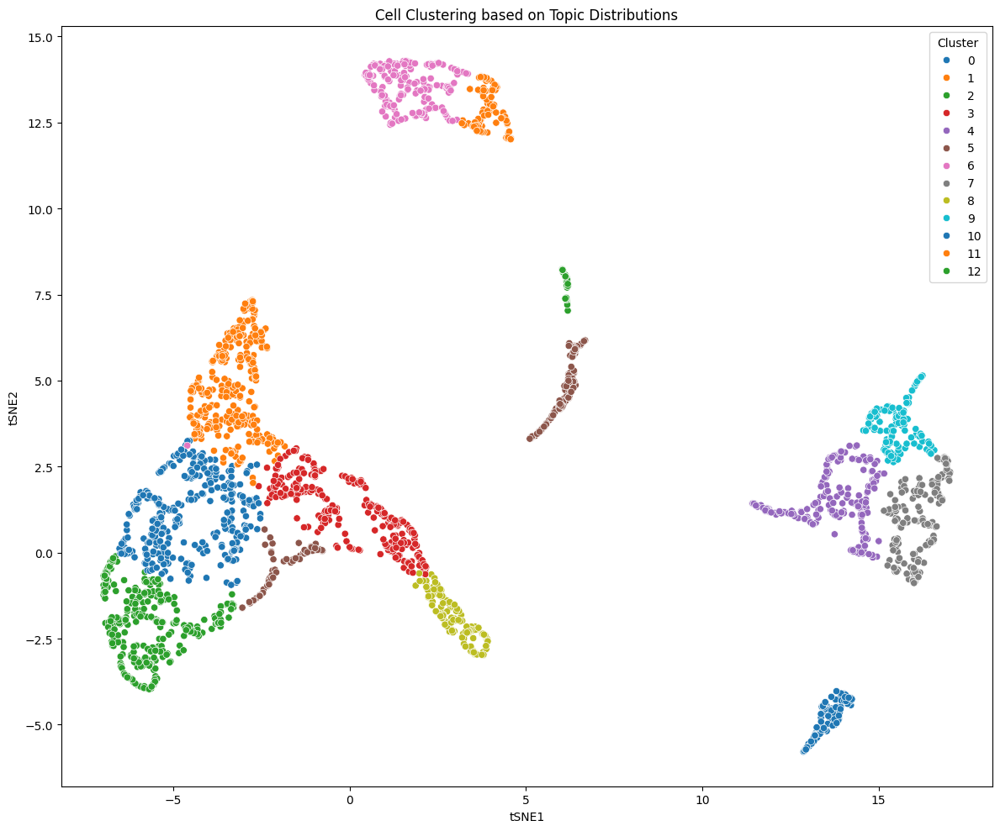

In [ ]:
# Plot final clustering
plt.figure(figsize=(12, 10))
sns.scatterplot(data=umap_df, x='tSNE1', y='tSNE2', hue='Cluster', palette='tab10')
plt.title('Cell Clustering based on Topic Distributions')
plt.tight_layout()
plt.savefig('cell_clusters_tsne.png')
plt.show()

#### Compare Clusters Function

In [ ]:
umap_df_leiden = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_leiden.csv', index_col=0)
print(umap_df_leiden.head())

                      tSNE1      tSNE2  Cluster
AAACATACAACCAC-1  -2.106222   1.932584        3
AAACATTGAGCTAC-1   0.543918  13.940084        6
AAACATTGATCAGC-1  -3.513001   5.773539        1
AAACCGTGCTTCCG-1  14.657708   3.581296        9
AAACCGTGTATGCG-1   0.092769   0.107285        3


In [ ]:
seurat_clusters = pd.read_csv("/content/drive/MyDrive/Capstone/pbmc_metadata.csv", index_col=0)
print(seurat_clusters[["seurat_clusters"]].head())

                  seurat_clusters
AAACATACAACCAC-1                2
AAACATTGAGCTAC-1                3
AAACATTGATCAGC-1                2
AAACCGTGCTTCCG-1                1
AAACCGTGTATGCG-1                6


In [ ]:
# Example usage:
contingency_table = compare_clusters(umap_df_leiden, seurat_clusters)
print(contingency_table)

Adjusted Rand Index: 0.4431
Normalized Mutual Information: 0.6611

Contingency Table (rows: tSNE clusters, columns: Seurat clusters):
seurat_cluster    0    1    2    3    4    5    6   7   8  Total
tsne_cluster                                                    
0               203    0  147    0    4    0    0   0   0    354
1                45    0  281    1   15    0    0   0   0    342
2               296    0   15    0    0    0    0   0   0    311
3                 3    0   27    1  224    0   22   1   1    279
4                 0  190    0    0    0   31    0   0   0    221
5               136   10    6    4   41    1    0   0  11    209
6                 1    0    0  196    0    0    0   2   0    199
7                 0  186    0    0    0    0    0   0   0    186
8                 0    0    0    0    6    0  133   0   0    139
9                 0   92    0    0    0   11    0  29   0    132
10                0    3    0    0    0  119    0   0   1    123
11                0  

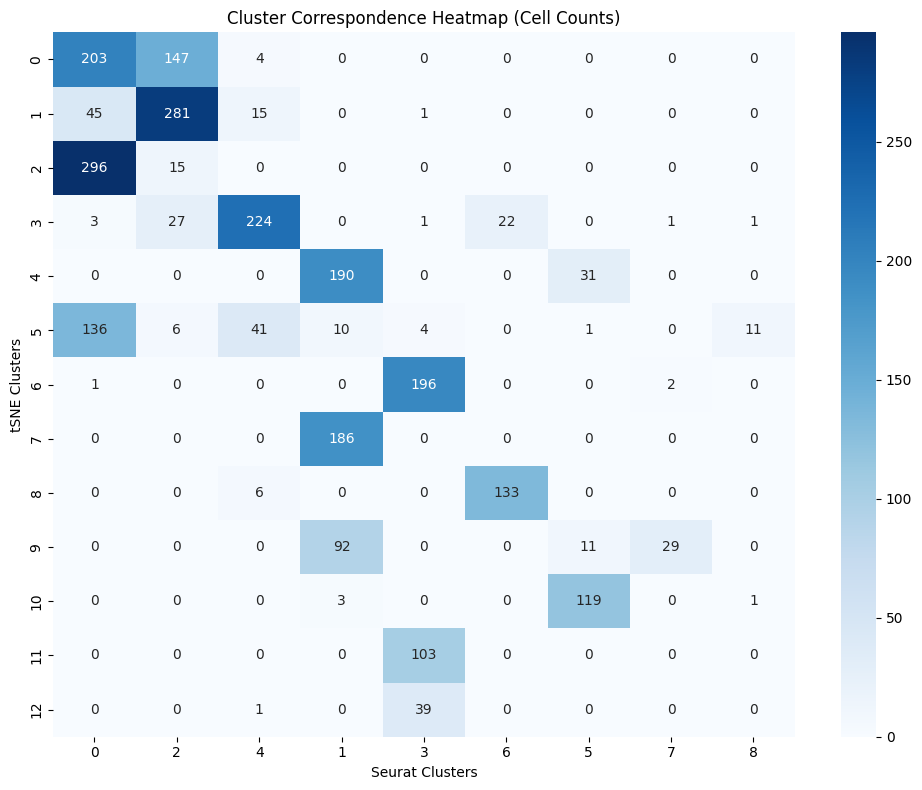

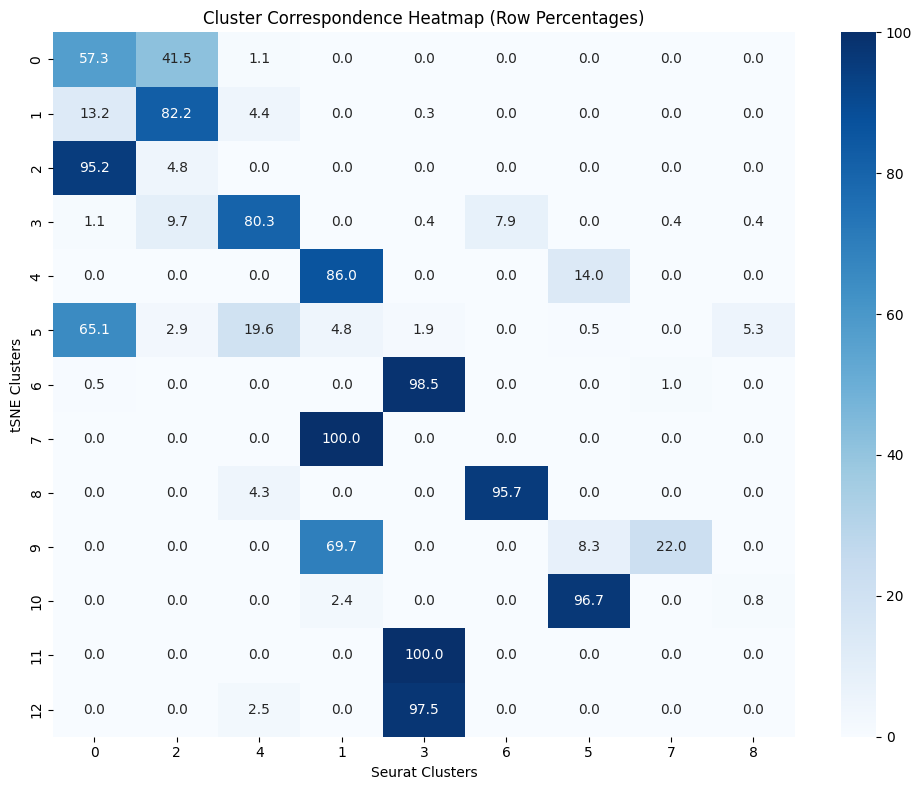

In [ ]:
# Plot sorted heatmaps
counts, percentages = plot_heatmaps(contingency_table)

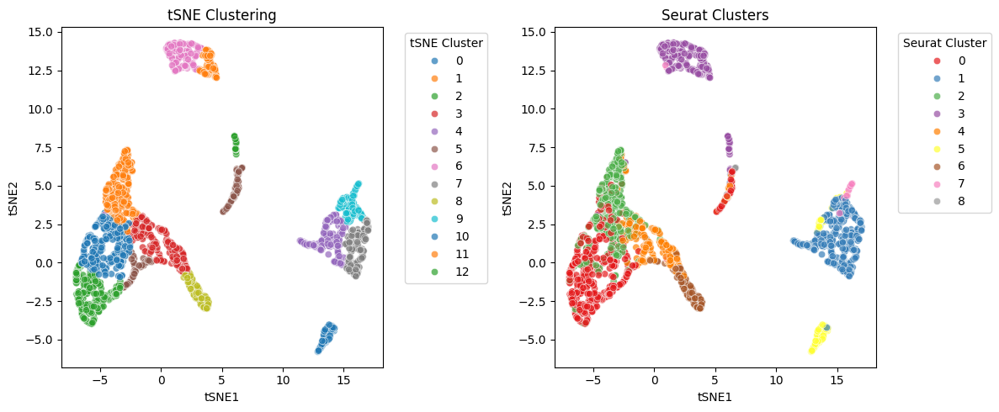

In [ ]:
plot_cluster_comparison_umap(umap_df_leiden, seurat_clusters)

In [ ]:
# Create a sankey diagram for cluster flow
try:
    import plotly.graph_objects as go
    from plotly.offline import plot

    # Prepare data for Sankey diagram
    source = []
    target = []
    value = []

    for i, row in contingency_table.iterrows():
        if i != 'Total':
            for j, count in row.items():
                if j != 'Total' and count > 0:
                    source.append(i)  # Your cluster
                    target.append(j + 9)  # Seurat cluster (offset by 9 to avoid overlap)
                    value.append(count)

    # Create node labels
    node_labels = [f"Your Cluster {i}" for i in range(9)] + [f"Seurat Cluster {i}" for i in range(9)]

    # Create Sankey diagram
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=node_labels
        ),
        link=dict(
            source=source,
            target=target,
            value=value
        )
    )])

    fig.update_layout(
        title_text="Cluster Correspondence Flow",
        font_size=12,
        height=800
    )

    # Save the figure to a file
    fig.write_html(f"/content/drive/MyDrive/Capstone/{version}/cluster_flow_leiden.html")
    print("\nSankey diagram saved to 'cluster_flow.html'")
except ImportError:
    print("\nCouldn't create Sankey diagram - plotly not available")


Sankey diagram saved to 'cluster_flow.html'


#### *Plot: Number of Topics vs. Silhouete*

# AutoEncoder

### Read Data

In [ ]:
cell_topic_df = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/cell_topic_df.csv', index_col=0)

print(cell_topic_df.head())
print(cell_topic_df.shape)

                   Topic_1   Topic_2   Topic_3   Topic_4   Topic_5   Topic_6  \
AAACATACAACCAC-1  0.007321  0.013837  0.008397  0.051493  0.030611  0.066301   
AAACATTGAGCTAC-1  0.004565  0.003553  0.071394  0.006671  0.006115  0.003453   
AAACATTGATCAGC-1  0.005585  0.004139  0.008334  0.076766  0.053700  0.032563   
AAACCGTGCTTCCG-1  0.026521  0.008461  0.016018  0.004912  0.004663  0.004211   
AAACCGTGTATGCG-1  0.014773  0.045495  0.002847  0.003179  0.003598  0.008414   

                   Topic_7   Topic_8   Topic_9  Topic_10  ...  Topic_41  \
AAACATACAACCAC-1  0.007565  0.026356  0.025049  0.006950  ...  0.006570   
AAACATTGAGCTAC-1  0.016650  0.003934  0.002806  0.146843  ...  0.014031   
AAACATTGATCAGC-1  0.004099  0.012699  0.005506  0.005150  ...  0.005331   
AAACCGTGCTTCCG-1  0.008659  0.006211  0.007159  0.008432  ...  0.063990   
AAACCGTGTATGCG-1  0.007753  0.007649  0.067695  0.004768  ...  0.004312   

                  Topic_42  Topic_43  Topic_44  Topic_45  Topic_46  

### DataLoader

In [ ]:
# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [ ]:
cell_topic_df.shape

(2638, 50)

In [ ]:
# Extract features and preprocess
X = cell_topic_df.values
cell_names = cell_topic_df.index.tolist()
topic_names = cell_topic_df.columns.tolist()

# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test = train_test_split(X_scaled, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)
X_test_tensor = torch.FloatTensor(X_test)

# Create dataset and loaders
train_dataset = TensorDataset(X_train_tensor, X_train_tensor)  # Input equals target for autoencoder
test_dataset = TensorDataset(X_test_tensor, X_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

### Autoencoder Architecture

In [ ]:
# Define the autoencoder architecture
class CellTopicAutoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=10, leaky_slope=0.2, dropout_rate=0.2):
        super(CellTopicAutoencoder, self).__init__()

        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 50),
            nn.BatchNorm1d(50),
            nn.LeakyReLU(leaky_slope, inplace=True),
            nn.Dropout(dropout_rate),

            nn.Linear(50, 30),
            nn.BatchNorm1d(30),
            nn.LeakyReLU(leaky_slope, inplace=True),
            nn.Dropout(dropout_rate),

            nn.Linear(30, 20),
            nn.BatchNorm1d(20),
            nn.LeakyReLU(leaky_slope, inplace=True),
        )

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Linear(20, latent_dim),
            nn.LeakyReLU(leaky_slope, inplace=True)
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 20),
            nn.BatchNorm1d(20),
            nn.LeakyReLU(leaky_slope, inplace=True),

            nn.Linear(20, 30),
            nn.BatchNorm1d(30),
            nn.LeakyReLU(leaky_slope, inplace=True),

            nn.Linear(30, 50),
            nn.BatchNorm1d(50),
            nn.LeakyReLU(leaky_slope, inplace=True),

            nn.Linear(50, input_dim),
            nn.Sigmoid()  # Use sigmoid if your data is normalized between 0 and 1
        )

    def encode(self, x):
        x = self.encoder(x)
        x = self.bottleneck(x)
        return x

    def decode(self, x):
        x = self.decoder(x)
        return x

    def forward(self, x):
        # Add noise for denoising effect (optional, can be removed if not needed)
        noisy_x = x + 0.1 * torch.randn_like(x)
        encoded = self.encode(noisy_x)
        decoded = self.decode(encoded)
        return decoded

### (Improve) Train
- CNN at the beginning
- Drop Out 0.2
- bottle neck : try 10, 20, 32
- Tune Momentum, Adam: Weight Decay (small + big), lr (smaller)

In [ ]:
# Initialize the model
input_dim = X_train.shape[1]  # Number of topics
latent_dim = 20  # Size of bottleneck layer
model = CellTopicAutoencoder(input_dim, latent_dim).to(device)
print(model)

CellTopicAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=50, out_features=50, bias=True)
    (1): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=50, out_features=30, bias=True)
    (5): BatchNorm1d(30, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): LeakyReLU(negative_slope=0.2, inplace=True)
    (7): Dropout(p=0.2, inplace=False)
    (8): Linear(in_features=30, out_features=20, bias=True)
    (9): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (bottleneck): Sequential(
    (0): Linear(in_features=20, out_features=20, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=20, out_features=20, bias=True)
    (1): BatchNorm1d(20, eps=1e-05

In [ ]:
# Calculate model parameter count
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

Total parameters: 10,670


Epoch [1/50], Train Loss: 1.2413, Val Loss: 1.2169
Epoch [2/50], Train Loss: 1.2023, Val Loss: 1.1812
Epoch [3/50], Train Loss: 1.1648, Val Loss: 1.1386
Epoch [4/50], Train Loss: 1.1269, Val Loss: 1.1057
Epoch [5/50], Train Loss: 1.0897, Val Loss: 1.0591
Epoch [6/50], Train Loss: 1.0560, Val Loss: 1.0156
Epoch [7/50], Train Loss: 1.0211, Val Loss: 0.9972
Epoch [8/50], Train Loss: 0.9919, Val Loss: 0.9731
Epoch [9/50], Train Loss: 0.9643, Val Loss: 0.9291
Epoch [10/50], Train Loss: 0.9367, Val Loss: 0.9073
Epoch [11/50], Train Loss: 0.9157, Val Loss: 0.8870
Epoch [12/50], Train Loss: 0.8897, Val Loss: 0.8661
Epoch [13/50], Train Loss: 0.8703, Val Loss: 0.8434
Epoch [14/50], Train Loss: 0.8527, Val Loss: 0.8290
Epoch [15/50], Train Loss: 0.8346, Val Loss: 0.8073
Epoch [16/50], Train Loss: 0.8181, Val Loss: 0.7941
Epoch [17/50], Train Loss: 0.8066, Val Loss: 0.7734
Epoch [18/50], Train Loss: 0.7931, Val Loss: 0.7648
Epoch [19/50], Train Loss: 0.7771, Val Loss: 0.7494
Epoch [20/50], Train 

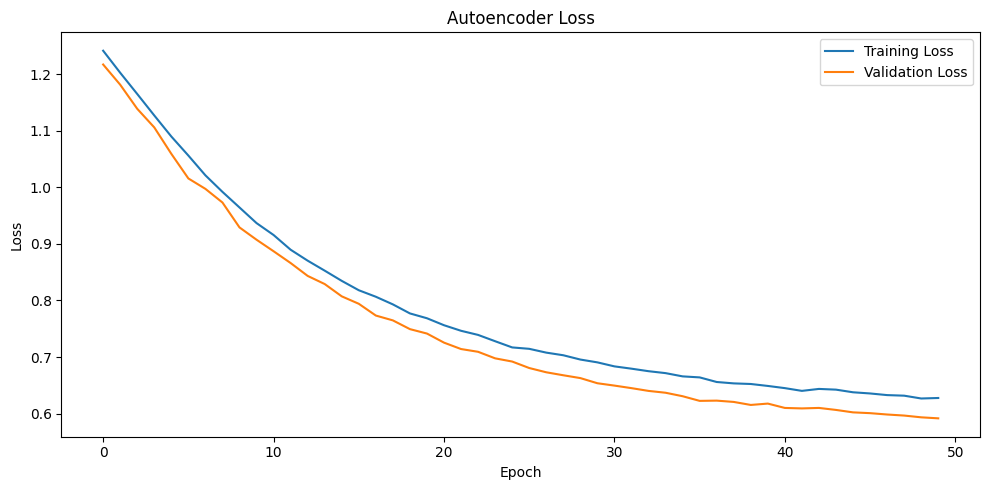

In [ ]:
# Loss and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(
    model.parameters(),
    lr=0.00005,           # Smaller learning rate
    weight_decay=1e-4,    # L2 regularization
    betas=(0.9, 0.999)    # Adam's default, can tune if needed
)

# Training history
train_losses = []
val_losses = []

num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for data, _ in train_loader:
        data = data.to(device)
        outputs = model(data)
        loss = criterion(outputs, data)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * data.size(0)
    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)

    # Validation
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for data, _ in test_loader:
            data = data.to(device)
            outputs = model(data)
            loss = criterion(outputs, data)
            running_loss += loss.item() * data.size(0)
    epoch_val_loss = running_loss / len(test_loader.dataset)
    val_losses.append(epoch_val_loss)

    print(f'Epoch [{epoch+1}/{num_epochs}], '
          f'Train Loss: {epoch_train_loss:.4f}, '
          f'Val Loss: {epoch_val_loss:.4f}')

# Visualize training history
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Autoencoder Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

### Latent Space Visualization

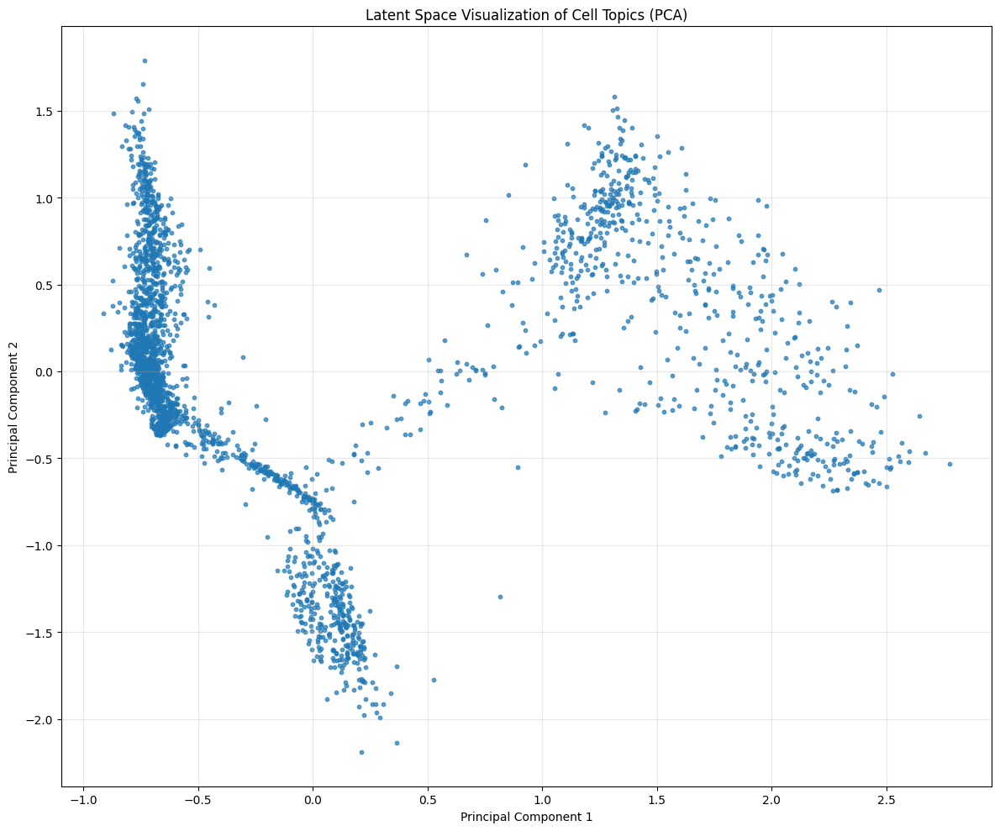

In [ ]:
# Generate latent space representations for all data
model.eval()
with torch.no_grad():
    # Get encoded representations for all data
    all_data_tensor = torch.FloatTensor(X_scaled).to(device)
    encoded_data = model.encode(all_data_tensor).cpu().numpy()

# Visualize latent space using PCA to reduce to 2D
pca = PCA(n_components=2)
encoded_data_2d = pca.fit_transform(encoded_data)

# Plot the latent space
plt.figure(figsize=(12, 10))
plt.scatter(encoded_data_2d[:, 0], encoded_data_2d[:, 1], alpha=0.7, s=10)
plt.title('Latent Space Visualization of Cell Topics (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

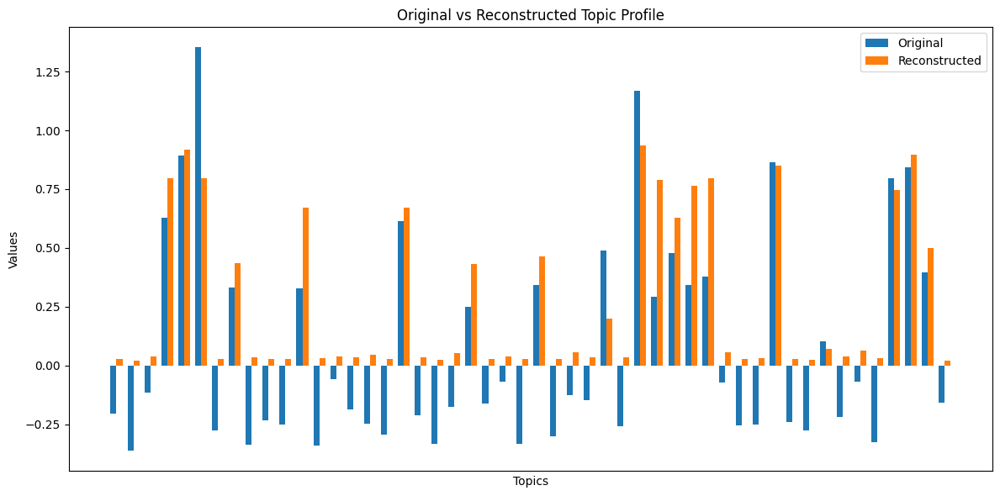

In [ ]:
# Compare original vs reconstructed data for a few examples
model.eval()
with torch.no_grad():
    # Get some test data
    test_samples = X_test_tensor[:5].to(device)
    reconstructed = model(test_samples).cpu().numpy()
    originals = test_samples.cpu().numpy()

# Create a function to visualize the topic profiles
def plot_topic_profile(original, reconstructed, index=0):
    plt.figure(figsize=(12, 6))
    x = np.arange(len(topic_names))
    width = 0.35

    plt.bar(x - width/2, original[index], width, label='Original')
    plt.bar(x + width/2, reconstructed[index], width, label='Reconstructed')

    plt.xlabel('Topics')
    plt.ylabel('Values')
    plt.title(f'Original vs Reconstructed Topic Profile')
    plt.xticks(rotation=90)

    if len(topic_names) <= 20:  # Only show labels if there aren't too many
        plt.xticks(x, topic_names, rotation=90)
    else:
        plt.xticks([])

    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot the first test sample
plot_topic_profile(originals, reconstructed, 0)

### Get Embedding Data

In [ ]:
# Additional functionality: Extract and use latent representations
def get_cell_embeddings(model, data_tensor):
    model.eval()
    with torch.no_grad():
        embeddings = model.encode(data_tensor)
    return embeddings.cpu().numpy()

# Get all cell embeddings
all_cell_embeddings = get_cell_embeddings(model, torch.FloatTensor(X_scaled).to(device))

# Create a DataFrame with cell embeddings
cell_embeddings_df = pd.DataFrame(
    all_cell_embeddings,
    index=cell_names,
    columns=[f'embedding_{i}' for i in range(latent_dim)]
)

print("Cell embeddings shape:", cell_embeddings_df.shape)
print(cell_embeddings_df.head())

Cell embeddings shape: (2638, 20)
                  embedding_0  embedding_1  embedding_2  embedding_3  \
AAACATACAACCAC-1    -0.056757    -0.050436    -0.014088    -0.014012   
AAACATTGAGCTAC-1    -0.045920     0.590317     0.856692     0.634562   
AAACATTGATCAGC-1    -0.033205    -0.070933     0.136305    -0.014922   
AAACCGTGCTTCCG-1     1.047565     1.063422     0.019741    -0.051098   
AAACCGTGTATGCG-1    -0.067021    -0.029369    -0.080068    -0.012519   

                  embedding_4  embedding_5  embedding_6  embedding_7  \
AAACATACAACCAC-1     0.012332     0.736810     0.108485     0.143945   
AAACATTGAGCTAC-1     0.615033     0.263229     0.470736     0.771045   
AAACATTGATCAGC-1    -0.097069     1.397050     0.036747     0.397212   
AAACCGTGCTTCCG-1     0.201326    -0.018449    -0.007628     1.270458   
AAACCGTGTATGCG-1     0.389637     0.191436    -0.111027     0.070983   

                  embedding_8  embedding_9  embedding_10  embedding_11  \
AAACATACAACCAC-1     0.148

In [ ]:
cell_embeddings_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/cell_embeddings_df.csv')
print("Cell-embeddings loadings saved to 'cell_embeddings_df.csv'")

Cell-embeddings loadings saved to 'cell_embeddings_df.csv'


# Cell Cluster

### Find Optimal Clusters

In [ ]:
cell_embeddings_df = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/cell_embeddings_df.csv', index_col=0)

In [ ]:
print(cell_embeddings_df.head())

                  embedding_0  embedding_1  embedding_2  embedding_3  \
AAACATACAACCAC-1    -0.056757    -0.050436    -0.014088    -0.014012   
AAACATTGAGCTAC-1    -0.045920     0.590317     0.856692     0.634562   
AAACATTGATCAGC-1    -0.033205    -0.070933     0.136305    -0.014922   
AAACCGTGCTTCCG-1     1.047565     1.063422     0.019741    -0.051098   
AAACCGTGTATGCG-1    -0.067021    -0.029369    -0.080068    -0.012519   

                  embedding_4  embedding_5  embedding_6  embedding_7  \
AAACATACAACCAC-1     0.012332     0.736810     0.108485     0.143945   
AAACATTGAGCTAC-1     0.615033     0.263229     0.470736     0.771045   
AAACATTGATCAGC-1    -0.097069     1.397050     0.036747     0.397212   
AAACCGTGCTTCCG-1     0.201326    -0.018449    -0.007628     1.270458   
AAACCGTGTATGCG-1     0.389637     0.191436    -0.111027     0.070983   

                  embedding_8  embedding_9  embedding_10  embedding_11  \
AAACATACAACCAC-1     0.148667    -0.059513     -0.067652    


Finding optimal number of clusters...
For n_clusters = 2, the silhouette score is 0.3957
For n_clusters = 3, the silhouette score is 0.3735
For n_clusters = 4, the silhouette score is 0.3697
For n_clusters = 5, the silhouette score is 0.4829
For n_clusters = 6, the silhouette score is 0.4988
For n_clusters = 7, the silhouette score is 0.5548
For n_clusters = 8, the silhouette score is 0.5139
For n_clusters = 9, the silhouette score is 0.5088
For n_clusters = 10, the silhouette score is 0.4924
For n_clusters = 11, the silhouette score is 0.4850
For n_clusters = 12, the silhouette score is 0.4640
For n_clusters = 13, the silhouette score is 0.4256
For n_clusters = 14, the silhouette score is 0.4274
For n_clusters = 15, the silhouette score is 0.4198


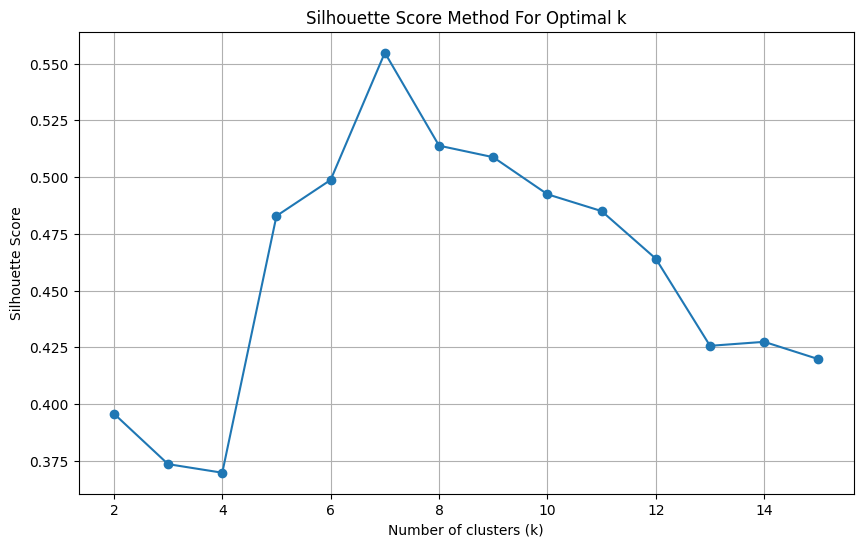

Optimal number of clusters: 7


In [ ]:
# Find optimal number of clusters using silhouette score
def find_optimal_clusters(embeddings_df, max_clusters=15):
    silhouette_scores = []

    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(embeddings_df.values)

        # Calculate silhouette score
        silhouette_avg = silhouette_score(embeddings_df.values, cluster_labels)
        silhouette_scores.append(silhouette_avg)

        print(f"For n_clusters = {n_clusters}, the silhouette score is {silhouette_avg:.4f}")

    # Plot silhouette scores
    plt.figure(figsize=(10, 6))
    plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Score Method For Optimal k')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

    # Return the optimal number of clusters
    optimal_clusters = np.argmax(silhouette_scores) + 2  # +2 because we start from 2
    return optimal_clusters

# Find optimal number of clusters
print("\nFinding optimal number of clusters...")
optimal_k = find_optimal_clusters(cell_embeddings_df, max_clusters=15)
print(f"Optimal number of clusters: {optimal_k}")

#### 10 Clusters

In [ ]:
# KMeans clustering on cell-topic distribution
kmeans = KMeans(n_clusters=7, random_state=42, n_init=7)
clusters = kmeans.fit_predict(cell_embeddings_df)

# UMAP for visualization
umap_reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
umap_result = umap_reducer.fit_transform(cell_embeddings_df)

# Create a DataFrame for plotting with the same column names as your example
umap_df = pd.DataFrame({
    'UMAP1': umap_result[:, 0],
    'UMAP2': umap_result[:, 1],
    'Cluster': clusters
}, index=cell_embeddings_df.index)

print(umap_df.head())

# Save tsne_df
umap_df.to_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_ae.csv')


score = silhouette_score(cell_embeddings_df, clusters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


                      UMAP1      UMAP2  Cluster
AAACATACAACCAC-1  -2.850430   5.400550        3
AAACATTGAGCTAC-1   7.304593  14.833457        4
AAACATTGATCAGC-1  -6.642854   5.904855        3
AAACCGTGCTTCCG-1  15.384255   4.670833        2
AAACCGTGTATGCG-1   0.330312   6.780180        5
Silhouette Score: 0.555


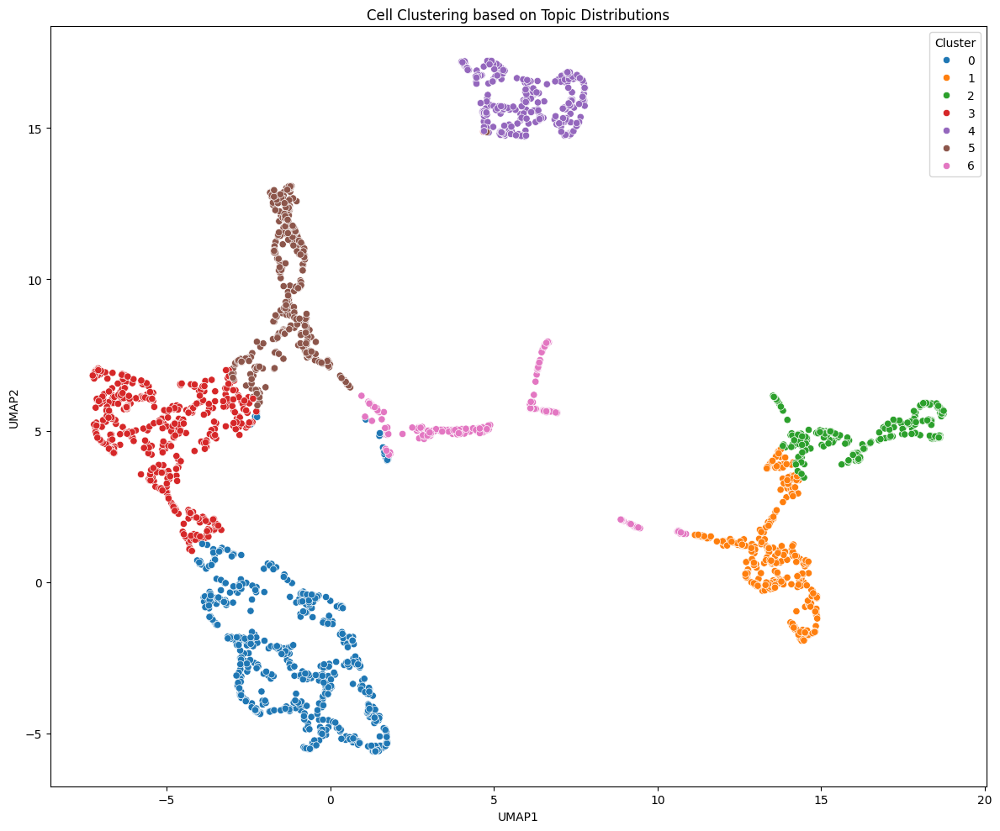

In [ ]:
# Plot final clustering
plt.figure(figsize=(12, 10))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='Cluster', palette='tab10')
plt.title('Cell Clustering based on Topic Distributions')
plt.tight_layout()
plt.savefig('cell_clusters_tsne.png')
plt.show()

#### Comparsion

In [ ]:
umap_df_ae = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/umap_df_ae.csv', index_col=0)
print(umap_df_ae.head())

                      UMAP1      UMAP2  Cluster
AAACATACAACCAC-1  -2.850430   5.400550        3
AAACATTGAGCTAC-1   7.304593  14.833457        4
AAACATTGATCAGC-1  -6.642854   5.904855        3
AAACCGTGCTTCCG-1  15.384255   4.670833        2
AAACCGTGTATGCG-1   0.330312   6.780181        5


In [ ]:
seurat_clusters = pd.read_csv("/content/drive/MyDrive/Capstone/pbmc_metadata.csv", index_col=0)
print(seurat_clusters[["seurat_clusters"]].head())

                  seurat_clusters
AAACATACAACCAC-1                2
AAACATTGAGCTAC-1                3
AAACATTGATCAGC-1                2
AAACCGTGCTTCCG-1                1
AAACCGTGTATGCG-1                6


In [ ]:
# Example usage:
contingency_table = compare_clusters(umap_df_ae, seurat_clusters)
print(contingency_table)

Adjusted Rand Index: 0.5434
Normalized Mutual Information: 0.6533

Contingency Table (rows: tSNE clusters, columns: Seurat clusters):
seurat_cluster    0    1    2    3    4    5    6   7   8  Total
tsne_cluster                                                    
0               489    0  114    0    7    0    0   0   0    610
1                 0  347    0    0    0    2    0   1   0    350
2                 0   79    0    0    0  156    0  29   1    265
3                76    0  348    5   51    0    0   0   0    480
4                 0    0    0  295    0    0    0   1   0    296
5                 3    0   10    1  193    0  155   1   1    364
6               116   55    4   43   40    4    0   0  11    273
Total           684  481  476  344  291  162  155  32  13   2638


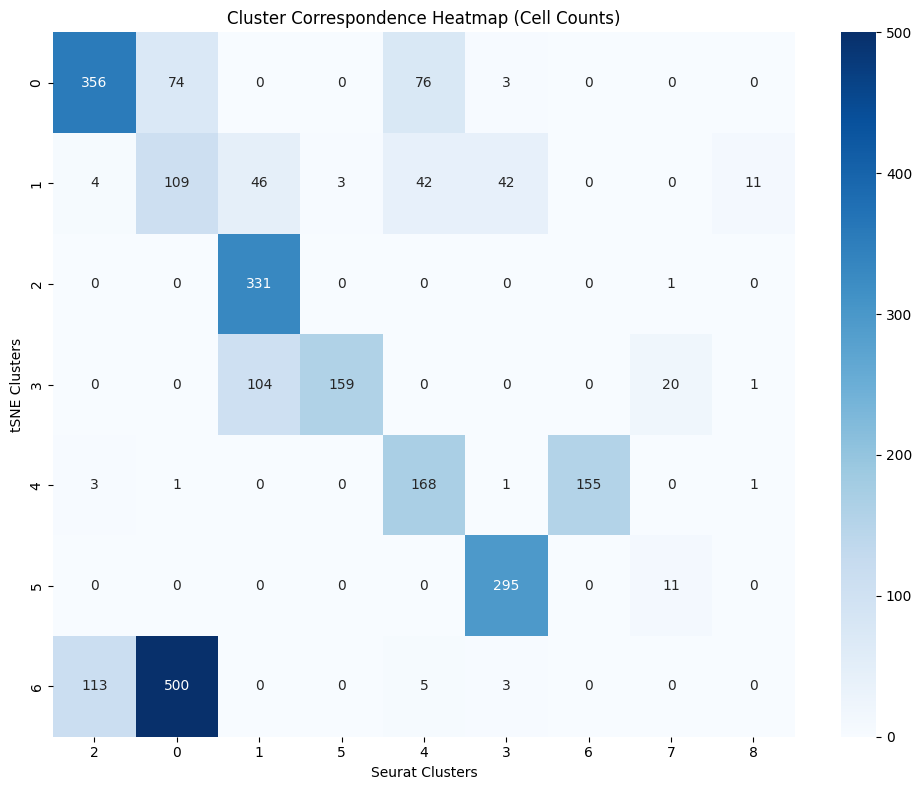

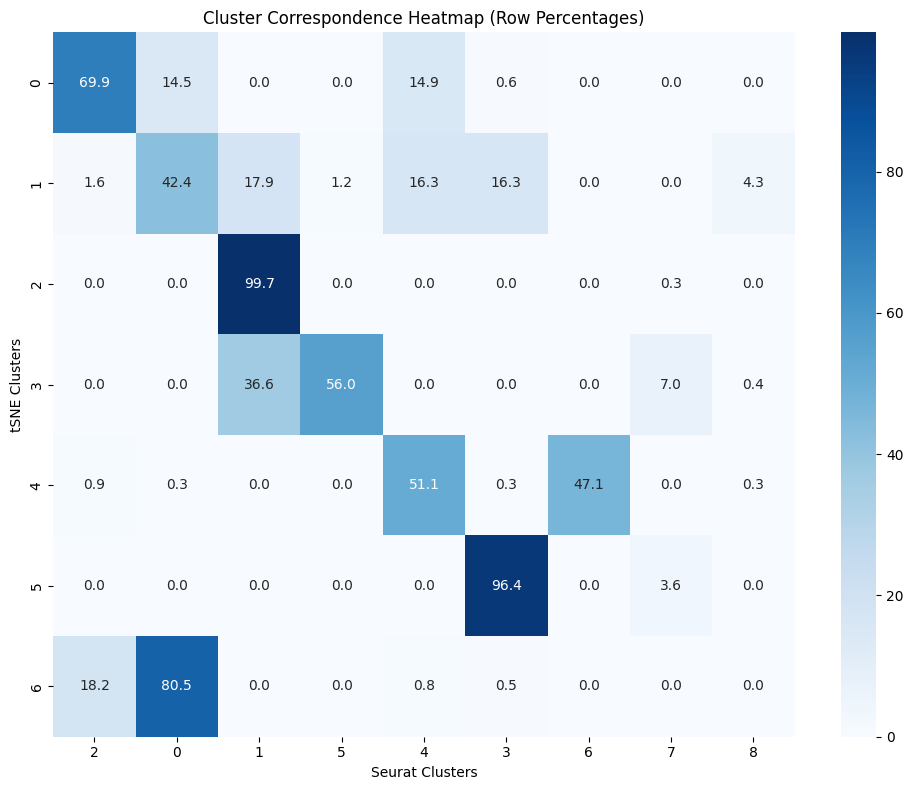

In [ ]:
# Plot sorted heatmaps
counts, percentages = plot_heatmaps(contingency_table)

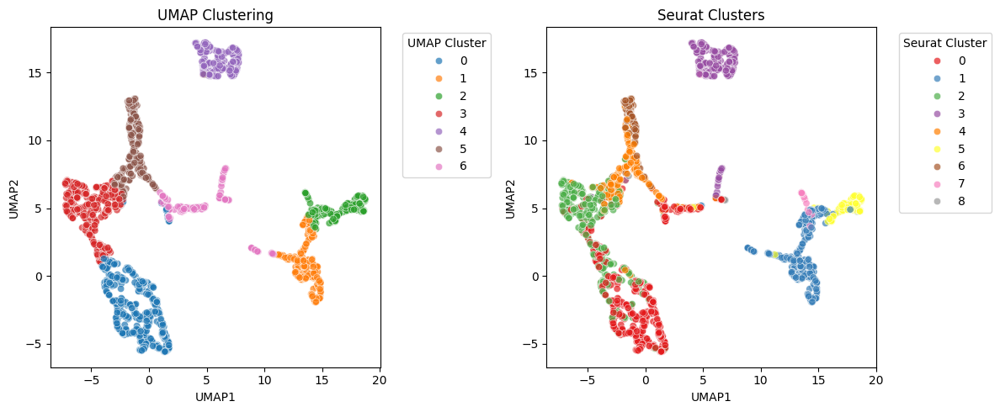

In [ ]:
plot_cluster_comparison_umap(umap_df_ae, seurat_clusters)

In [ ]:
# Create a sankey diagram for cluster flow
try:
    import plotly.graph_objects as go
    from plotly.offline import plot

    # Prepare data for Sankey diagram
    source = []
    target = []
    value = []

    for i, row in contingency_table.iterrows():
        if i != 'Total':
            for j, count in row.items():
                if j != 'Total' and count > 0:
                    source.append(i)  # Your cluster
                    target.append(j + 9)  # Seurat cluster (offset by 9 to avoid overlap)
                    value.append(count)

    # Create node labels
    node_labels = [f"Your Cluster {i}" for i in range(9)] + [f"Seurat Cluster {i}" for i in range(9)]

    # Create Sankey diagram
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=node_labels
        ),
        link=dict(
            source=source,
            target=target,
            value=value
        )
    )])

    fig.update_layout(
        title_text="Cluster Correspondence Flow",
        font_size=12,
        height=800
    )

    # Save the figure to a file
    fig.write_html(f"/content/drive/MyDrive/Capstone/{version}/cluster_flow_ae.html")
    print("\nSankey diagram saved to 'cluster_flow.html'")
except ImportError:
    print("\nCouldn't create Sankey diagram - plotly not available")


Sankey diagram saved to 'cluster_flow.html'


### Analyze Topcis in Cluster

In [ ]:
# ----- ANALYZE THE IMPORTANCE OF TOPICS FOR EACH CLUSTER -----
cluster_topic_importance_ae = pd.DataFrame()
for cluster in range(7):
    # Get cells in this cluster (now cell names)
    cluster_cells = umap_df_ae[umap_df_ae['Cluster'] == cluster].index
    # Intersect for safety
    cluster_cells = cell_topic_df.index.intersection(cluster_cells)
    # Calculate mean topic distribution for these cells
    cluster_topic_means = cell_topic_df.loc[cluster_cells].mean()
    cluster_topic_importance_ae[f'Cluster_{cluster}'] = cluster_topic_means

cluster_topic_importance_ae.to_csv(f'/content/drive/MyDrive/Capstone/{version}/cluster_topic_importance_ae.csv')
print(cluster_topic_importance_ae.head())

         Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5  \
Topic_1   0.009327   0.031008   0.081161   0.020751   0.007556   0.008173   
Topic_2   0.007574   0.095415   0.008275   0.006978   0.008838   0.027383   
Topic_3   0.010559   0.004491   0.010986   0.024019   0.006789   0.041826   
Topic_4   0.057225   0.007860   0.004400   0.004394   0.015977   0.009329   
Topic_5   0.042048   0.006690   0.004309   0.004098   0.007713   0.008493   

         Cluster_6  
Topic_1   0.008322  
Topic_2   0.013833  
Topic_3   0.008819  
Topic_4   0.016909  
Topic_5   0.032138  


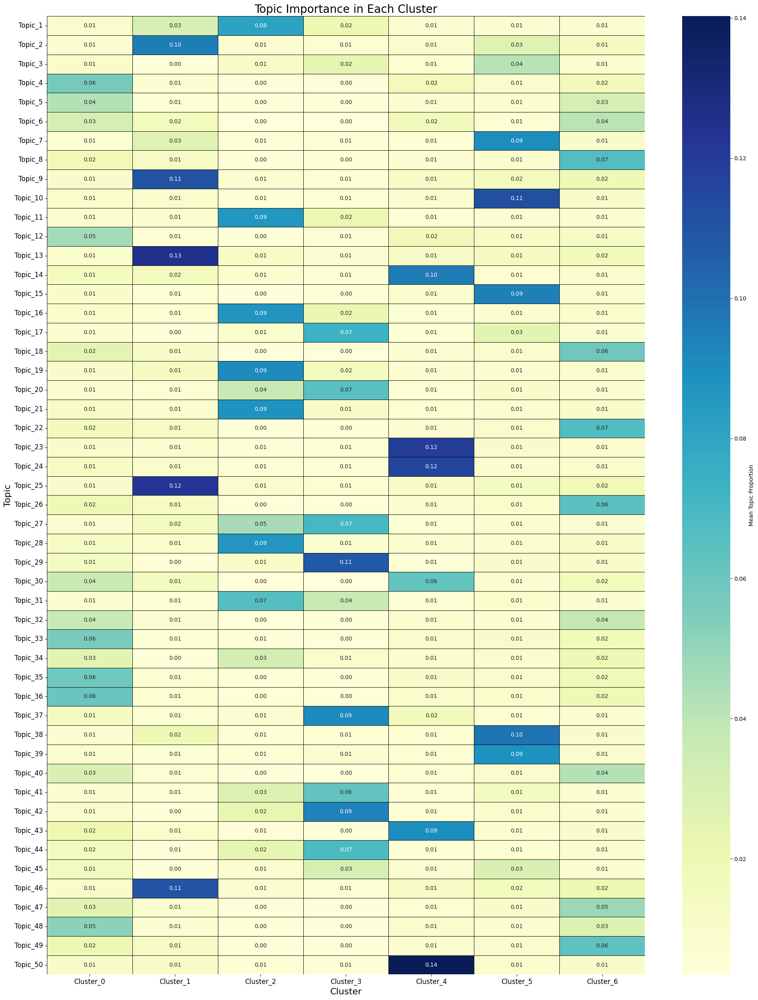

In [ ]:
plt.figure(figsize=(20, len(cluster_topic_importance_ae)/2))  # Adjust width and height dynamically
sns.heatmap(cluster_topic_importance_ae,
            cmap="YlGnBu",
            annot=True,       # Display values
            fmt=".2f",        # Format values to 2 decimal places
            linewidths=.5,    # Add lines between cells
            linecolor="black",  # Line color
            cbar_kws={'label': 'Mean Topic Proportion'}) # Colorbar label

plt.title('Topic Importance in Each Cluster', fontsize=20)  # Title
plt.xlabel('Cluster', fontsize=16)                  # X label
plt.ylabel('Topic', fontsize=16)                    # Y label

plt.xticks(fontsize=12)  # X tick font size
plt.yticks(fontsize=12, rotation=0)  # Y tick font size, no rotation

plt.tight_layout()
# plt.savefig('cluster_topic_heatmap_improved.png', bbox_inches='tight') # Save
plt.show()

          Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5  \
Topic_50   0.010309   0.010603   0.006235   0.005485   0.140245   0.008914   
Topic_13   0.009375   0.125066   0.011840   0.007587   0.011026   0.013981   
Topic_25   0.009996   0.122271   0.009583   0.006856   0.011706   0.014348   
Topic_23   0.010235   0.008381   0.005379   0.006045   0.118915   0.010413   
Topic_24   0.013611   0.009523   0.005247   0.005362   0.116159   0.008206   

          Cluster_6  
Topic_50   0.009931  
Topic_13   0.016353  
Topic_25   0.018119  
Topic_23   0.009301  
Topic_24   0.009849  


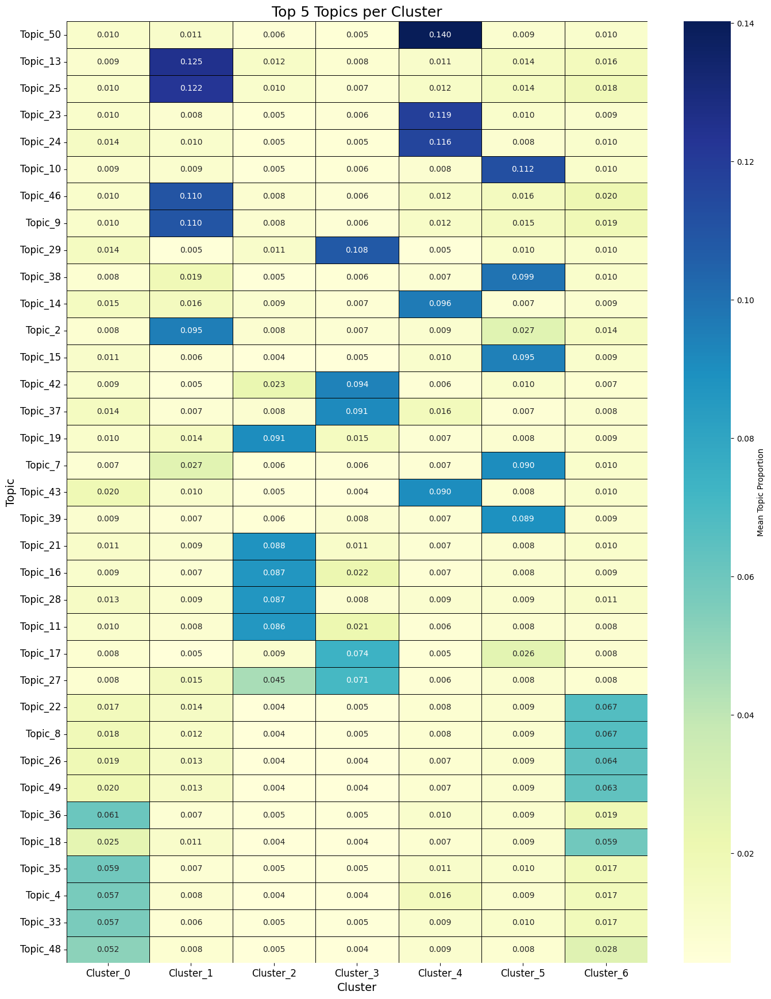

In [ ]:
# cluster_topic_importance_ae: DataFrame with topics as rows, clusters as columns (after .T)
# We'll build a mask of the top 10 topics per cluster
top_n = 5
top_topics = set()

for cluster in cluster_topic_importance_ae.columns:
    # Get the top 10 topics (row labels) for this cluster
    top = cluster_topic_importance_ae[cluster].nlargest(top_n).index
    top_topics.update(top)

# Subset the DataFrame to only these topics
top_topics = list(top_topics)
focused_df_ae = cluster_topic_importance_ae.loc[top_topics]

# Sort topics by their maximum value across clusters
focused_df_ae = focused_df_ae.loc[focused_df_ae.max(axis=1).sort_values(ascending=False).index]

focused_df_ae.to_csv(f'/content/drive/MyDrive/Capstone/{version}/focused_df_ae.csv')
print(focused_df_ae.head())

plt.figure(figsize=(14, max(6, 0.5 * len(focused_df_ae))))  # Adjust height to number of topics
sns.heatmap(
    focused_df_ae,
    cmap="YlGnBu",
    annot=True,
    fmt=".3f",
    linewidths=0.5,
    linecolor="black",
    cbar_kws={'label': 'Mean Topic Proportion'}
)
plt.title(f'Top {top_n} Topics per Cluster', fontsize=18)
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Topic', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
# plt.savefig('top10_topics_per_cluster_heatmap.png', bbox_inches='tight')
plt.show()


### Pathway Analysis

In [ ]:
cluster_topic_importance_ae = pd.read_csv(f'/content/drive/MyDrive/Capstone/{version}/cluster_topic_importance_ae.csv', index_col=0)
print(cluster_topic_importance_ae.head())

         Cluster_0  Cluster_1  Cluster_2  Cluster_3  Cluster_4  Cluster_5  \
Topic_1   0.008395   0.009143   0.083655   0.008110   0.024210   0.007890   
Topic_2   0.025338   0.006975   0.008858   0.012629   0.086904   0.008482   
Topic_3   0.033819   0.010549   0.010520   0.008766   0.005189   0.007411   
Topic_4   0.009903   0.057234   0.004397   0.016405   0.009927   0.020147   
Topic_5   0.009048   0.044733   0.004305   0.032259   0.008644   0.009579   

         Cluster_6  
Topic_1   0.021694  
Topic_2   0.007058  
Topic_3   0.032820  
Topic_4   0.004289  
Topic_5   0.004015  


In [ ]:
# Step 1: Get top 5 topics per cluster
cti_long = (
    cluster_topic_importance_ae
    .reset_index()
    .melt(id_vars='index', var_name='Cluster_ID', value_name='Topic_Prob')
    .rename(columns={'index': 'Topic'})
)
cti_long['Cluster_ID'] = cti_long['Cluster_ID'].astype(str)  # Ensure consistent typing

top_topics = (
    cti_long
    .groupby('Cluster_ID', group_keys=False)
    .apply(lambda x: x.nlargest(5, 'Topic_Prob'))
)

# Step 2: Get top 5 terms per topic-cluster combination
merged_terms = (
    top_topics
    .merge(all_enrich_df, on='Topic', how='inner')
    .groupby(['Cluster_ID', 'Topic'], group_keys=False)
    .apply(lambda x: x.nlargest(5, 'Combined Score'))
)

# Step 3: Add top genes and format final table
final_table = (
    merged_terms
    .merge(topic_top_gene_df.reset_index().rename(columns={'index': 'Topic'}),
           on='Topic', how='left')
    [['Cluster_ID', 'Topic', 'Topic_Prob',
      'TopGene_1', 'TopGene_2', 'TopGene_3', 'TopGene_4', 'TopGene_5','Prob_1','Prob_2','Prob_3','Prob_4','Prob_5',
      'Term', 'Genes', 'Combined Score']]
    .sort_values(['Cluster_ID', 'Topic_Prob'], ascending=[True, False])
    .reset_index(drop=True)
)

<ipython-input-8-7d57da7b6a90>:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(5, 'Topic_Prob'))
<ipython-input-8-7d57da7b6a90>:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.nlargest(5, 'Combined Score'))


In [ ]:
final_table.to_csv(f"/content/drive/MyDrive/Capstone/{version}/cluster_topic_gene_pathway_ae.csv")

In [ ]:
cluster_topic_gene_pathway_ae = pd.read_csv(f"/content/drive/MyDrive/Capstone/{version}/cluster_topic_gene_pathway_ae.csv", index_col=0)
print(cluster_topic_gene_pathway_ae.head())

  Cluster_ID     Topic  Topic_Prob TopGene_1 TopGene_2 TopGene_3 TopGene_4  \
0  Cluster_0  Topic_10    0.116792      CD74   HLA-DRA  HLA-DPB1     CD79A   
1  Cluster_0  Topic_10    0.116792      CD74   HLA-DRA  HLA-DPB1     CD79A   
2  Cluster_0  Topic_10    0.116792      CD74   HLA-DRA  HLA-DPB1     CD79A   
3  Cluster_0  Topic_10    0.116792      CD74   HLA-DRA  HLA-DPB1     CD79A   
4  Cluster_0  Topic_10    0.116792      CD74   HLA-DRA  HLA-DPB1     CD79A   

  TopGene_5    Prob_1    Prob_2    Prob_3    Prob_4    Prob_5  \
0     CD79B  0.000816  0.000764  0.000674  0.000669  0.000661   
1     CD79B  0.000816  0.000764  0.000674  0.000669  0.000661   
2     CD79B  0.000816  0.000764  0.000674  0.000669  0.000661   
3     CD79B  0.000816  0.000764  0.000674  0.000669  0.000661   
4     CD79B  0.000816  0.000764  0.000674  0.000669  0.000661   

                                  Term                  Genes  Combined Score  
0  Antigen processing and presentation  CD74;HLA-DPB1;HLA-DR

#### Cluster > Topic > Genes

In [ ]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from wordcloud import WordCloud
from io import BytesIO
import base64

# --- Example DataFrame Construction (replace with your actual data) ---
# Each row: one topic in a cluster, with top 5 genes and their probabilities
df = cluster_topic_gene_pathway_ae.copy()

def get_distinct_colors(n):
    import colorsys
    import random
    colors = []
    golden_ratio_conjugate = 0.618033988749895
    h = random.random()
    for _ in range(n):
        h = (h + golden_ratio_conjugate) % 1
        s = 0.5 + 0.3 * random.random()
        v = 0.85 + 0.15 * random.random()
        r, g, b = colorsys.hsv_to_rgb(h, s, v)
        colors.append(f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, 0.3)')
    return colors

def plot_cluster_topic_gene_cloud_with_wordcloud(df, cluster_id):
    cluster_df = df[df['Cluster_ID'] == cluster_id].drop_duplicates(subset=['Topic'])
    n_topics = cluster_df.shape[0]
    grid_size = int(np.ceil(np.sqrt(n_topics)))

    # Generate topic positions in grid
    xs, ys = [], []
    for i in range(n_topics):
        row = i // grid_size
        col = i % grid_size
        xs.append(col * 6)
        ys.append(-row * 6)

    colors = get_distinct_colors(n_topics)
    fig = go.Figure()

    for i, (_, row) in enumerate(cluster_df.iterrows()):
        x, y = xs[i], ys[i]
        topic = row['Topic']
        topic_prob = row['Topic_Prob']
        radius = 3 + 7 * np.log10(topic_prob + 1e-6)  # avoid log(0)

        # Draw topic bubble (circle shape)
        fig.add_shape(
            type="circle",
            xref="x", yref="y",
            x0=x - radius, y0=y - radius,
            x1=x + radius, y1=y + radius,
            fillcolor=colors[i],
            line_color='rgba(0,0,0,0.2)',
            layer='below'
        )

        # --- WORD CLOUD GENERATION ---
        genes = [
            (row['TopGene_1'], row['Prob_1']),
            (row['TopGene_2'], row['Prob_2']),
            (row['TopGene_3'], row['Prob_3']),
            (row['TopGene_4'], row['Prob_4']),
            (row['TopGene_5'], row['Prob_5']),
        ]
        gene_freq = {gene: prob for gene, prob in genes if pd.notna(gene) and pd.notna(prob)}

        if gene_freq:
            wc = WordCloud(width=300, height=300, background_color=None, mode='RGBA')
            wc.generate_from_frequencies(gene_freq)

            # Convert wordcloud to PNG image and then to base64
            img_buf = BytesIO()
            wc.to_image().save(img_buf, format='PNG')
            img_buf.seek(0)
            img_b64 = base64.b64encode(img_buf.read()).decode('utf-8')
            img_uri = "data:image/png;base64," + img_b64

            # Overlay word cloud image at bubble center (perfect alignment)
            cloud_scale = 1.2  # <--- make this smaller to shrink the word cloud

            fig.add_layout_image(
                dict(
                    source=img_uri,
                    xref="x", yref="y",
                    x=x,
                    y=y,
                    sizex=radius * cloud_scale,
                    sizey=radius * cloud_scale,
                    xanchor="center",
                    yanchor="middle",
                    layer="above"
                )
            )


        # Topic label above bubble
        fig.add_trace(go.Scatter(
            x=[x], y=[y + radius + 0.5],
            text=[topic],
            mode='text',
            textfont=dict(size=18, family='Arial', color='black'),
            hoverinfo='skip',
            showlegend=False
        ))

    fig.update_layout(
        title=f'Cluster {cluster_id}: Topics and Top Genes (Word Cloud Overlay)',
        xaxis=dict(visible=False),
        yaxis=dict(visible=False, scaleanchor="x"),
        width=900,
        height=700,
        plot_bgcolor='white',
        margin=dict(l=20, r=20, t=60, b=20)
    )

    fig.show()

# --- Example usage ---
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_0')


In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_1')

In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_2')

In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_3')

In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_4')

In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_5')

In [ ]:
plot_cluster_topic_gene_cloud_with_wordcloud(df, 'Cluster_6')

#### Cluster > Topic > Pathways

In [ ]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from wordcloud import WordCloud
from io import BytesIO
import base64

def get_distinct_colors(n):
    import colorsys
    import random
    colors = []
    golden_ratio_conjugate = 0.618033988749895
    h = random.random()
    for _ in range(n):
        h = (h + golden_ratio_conjugate) % 1
        s = 0.5 + 0.3 * random.random()
        v = 0.85 + 0.15 * random.random()
        r, g, b = colorsys.hsv_to_rgb(h, s, v)
        colors.append(f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, 0.3)')
    return colors

def wrap_term(term, max_length=12):
    """Insert a space every max_length characters for long terms."""
    words = term.split()
    wrapped_words = []
    for word in words:
        if len(word) > max_length:
            wrapped_word = ' '.join([word[i:i+max_length] for i in range(0, len(word), max_length)])
            wrapped_words.append(wrapped_word)
        else:
            wrapped_words.append(word)
    return ' '.join(wrapped_words)

def plot_cluster_topic_term_cloud(df, all_enrich_df, cluster_id):
    cluster_df = df[df['Cluster_ID'] == cluster_id].drop_duplicates(subset=['Topic'])
    n_topics = cluster_df.shape[0]
    grid_size = int(np.ceil(np.sqrt(n_topics)))

    # Generate topic positions in grid
    xs, ys = [], []
    for i in range(n_topics):
        row = i // grid_size
        col = i % grid_size
        xs.append(col * 6)
        ys.append(-row * 6)

    colors = get_distinct_colors(n_topics)
    fig = go.Figure()

    for i, (_, row) in enumerate(cluster_df.iterrows()):
        x, y = xs[i], ys[i]
        topic = row['Topic']
        topic_prob = row['Topic_Prob']
        radius = 3 + 7 * np.log10(topic_prob + 1e-6)  # avoid log(0)

        # Draw topic bubble (circle shape)
        fig.add_shape(
            type="circle",
            xref="x", yref="y",
            x0=x - radius, y0=y - radius,
            x1=x + radius, y1=y + radius,
            fillcolor=colors[i],
            line_color='rgba(0,0,0,0.2)',
            layer='below'
        )

        # --- WORD CLOUD OF PATHWAY TERMS ---
        topic_terms = all_enrich_df[all_enrich_df['Topic'] == topic]
        top5 = topic_terms.nlargest(5, 'Combined Score')
        # Wrap long terms for better word cloud appearance
        term_freq = {wrap_term(term): score for term, score in zip(top5['Term'], top5['Combined Score'])}

        if term_freq:
            wc = WordCloud(
                width=320,
                height=320,
                background_color=None,
                mode='RGBA',
                colormap='tab10',
                relative_scaling=1,
                max_font_size=80,
                prefer_horizontal=0.8
            )
            wc.generate_from_frequencies(term_freq)

            # Convert wordcloud to PNG image and then to base64
            img_buf = BytesIO()
            wc.to_image().save(img_buf, format='PNG')
            img_buf.seek(0)
            img_b64 = base64.b64encode(img_buf.read()).decode('utf-8')
            img_uri = "data:image/png;base64," + img_b64

            # Overlay word cloud image at bubble center (perfect alignment)
            cloud_scale = 2.2  # adjust as desired
            fig.add_layout_image(
                dict(
                    source=img_uri,
                    xref="x", yref="y",
                    x=x,
                    y=y,
                    sizex=radius * cloud_scale,
                    sizey=radius * cloud_scale,
                    xanchor="center",
                    yanchor="middle",
                    layer="above"
                )
            )

        # Topic label above bubble
        fig.add_trace(go.Scatter(
            x=[x], y=[y + radius + 0.5],
            text=[topic],
            mode='text',
            textfont=dict(size=18, family='Arial', color='black'),
            hoverinfo='skip',
            showlegend=False
        ))

    fig.update_layout(
        title=f'Cluster {cluster_id}: Topics and Top Pathway Terms (Word Cloud Overlay)',
        xaxis=dict(visible=False),
        yaxis=dict(visible=False, scaleanchor="x"),
        width=900,
        height=700,
        plot_bgcolor='white',
        margin=dict(l=20, r=20, t=60, b=20)
    )

    fig.show()

# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_0')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_1')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_2')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_3')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_4')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_5')

In [ ]:
# --- Example usage ---
plot_cluster_topic_term_cloud(cluster_topic_gene_pathway_ae, all_enrich_df, 'Cluster_6')

In [ ]:
cluster_topic_gene_pathway_ae[cluster_topic_gene_pathway_ae['Cluster_ID']=="Cluster_0"]

,Cluster_ID,Topic,Topic_Prob,TopGene_1,TopGene_2,TopGene_3,TopGene_4,TopGene_5,Prob_1,Prob_2,Prob_3,Prob_4,Prob_5,Term,Genes,Combined Score
0,Cluster_0,Topic_10,0.116792,CD74,HLA-DRA,HLA-DPB1,CD79A,CD79B,0.000816,0.000764,0.000674,0.000669,0.000661,Antigen processing and presentation,CD74;HLA-DPB1;HLA-DRA,5.729873e+03
1,Cluster_0,Topic_10,0.116792,CD74,HLA-DRA,HLA-DPB1,CD79A,CD79B,0.000816,0.000764,0.000674,0.000669,0.000661,Asthma,HLA-DPB1;HLA-DRA,4.898376e+03
2,Cluster_0,Topic_10,0.116792,CD74,HLA-DRA,HLA-DPB1,CD79A,CD79B,0.000816,0.000764,0.000674,0.000669,0.000661,Allograft rejection,HLA-DPB1;HLA-DRA,3.792021e+03
3,Cluster_0,Topic_10,0.116792,CD74,HLA-DRA,HLA-DPB1,CD79A,CD79B,0.000816,0.000764,0.000674,0.000669,0.000661,Graft-versus-host disease,HLA-DPB1;HLA-DRA,3.344840e+03
4,Cluster_0,Topic_10,0.116792,CD74,HLA-DRA,HLA-DPB1,CD79A,CD79B,0.000816,0.000764,0.000674,0.000669,0.000661,Type I diabetes mellitus,HLA-DPB1;HLA-DRA,3.247674e+03
5,Cluster_0,Topic_38,0.100619,CD74,CD37,CD79A,CD79B,HLA-DRA,0.000699,0.000672,0.000655,0.000650,0.000650,Antigen processing and presentation,CD74;HLA-DRA,1.539611e+03
6,Cluster_0,Topic_38,0.100619,CD74,CD37,CD79A,CD79B,HLA-DRA,0.000699,0.000672,0.000655,0.000650,0.000650,B cell receptor signaling pathway,CD79B;CD79A,1.468206e+03
7,Cluster_0,Topic_38,0.100619,CD74,CD37,CD79A,CD79B,HLA-DRA,0.000699,0.000672,0.000655,0.000650,0.000650,Hematopoietic cell lineage,HLA-DRA;CD37,1.139725e+03
8,Cluster_0,Topic_38,0.100619,CD74,CD37,CD79A,CD79B,HLA-DRA,0.000699,0.000672,0.000655,0.000650,0.000650,Asthma,HLA-DRA,8.090940e+02
9,Cluster_0,Topic_38,0.100619,CD74,CD37,CD79A,CD79B,HLA-DRA,0.000699,0.000672,0.000655,0.000650,0.000650,Allograft rejection,HLA-DRA,6.284308e+02


#### *Need to improve annomation : pck for interactive dinamic visulization for topic mining; Example code for table with cell - gene*